**Project 2: Supervised Machine Learning: Classification & Regression**

**1. Project Information**


*   **Project Title** - *“Predictive Modeling Using Supervised Machine Learning Techniques for Classification and Decision Support”*



**2. Description of Data**


*   Data Source - https://www.kaggle.com/datasets/satyaworks/perishable-goods-supply-chain-and-transport-dataset
*   Data Size: **26.1 MB**
*  Data Type: **Cross-sectional**
*  Data Dimension:
     * Number of Variables - **32**
     * Number of Observations - **100,000**

*   Data Variable Type:

    **Numeric**-
    *  Integer - **11 columns**
    
    (Daily Production/Quantity, No. of Vehicles Used Per Day, Trip Frequency, Average Distance Travelled (km), Temperature Maintained (°C), Humidity Maintained (%), Daily Demand, Shelf Life (Days), Transportation Cost per Trip, Storage Cost, Wastage Cost). **All are 100,000 non-null.**
    *  Float - **5 columns**

      (Vehicle Capacity (kg/ton), Transport Duration (hours), Unloading Time, Total Supply Chain Time, Spoilage Percentage (%)). **All are 100,000 non-null.**

     **Non-Numeric** -
       *   Object -
    **16 columns**

    (Product Name, Category, Transportation Method, Vehicle Type, Packaging Method, Time of Harvest, Time to Loading, Source Location, Destination Location, Who Receives the Goods?, End User Type, Is Real-time Tracking Used?, Tracking Method, Data Collected, Initial Quality Grade, Reasons for Spoilage). *Note* - **Tracking Method has 50,125 non-null entries, suggesting missing values.**
     
* Data Variable Category-I:

1.   **Non-Categorical**: All Numeric Values (integer + Float)

2.   **Categorical** -  
     *  **Nominal** -  Product Name, Category, Transportation Method, Vehicle Type, Packaging Method, Time of Harvest, Time of Loading, Source Location, Destination Location, Who Receives the Goods?, End user type, Is Real time Tracking Used?, Tracking Method, Data Collected, Reasons For Spoilage
     *  **Ordinal** - Inital Quality Grade
*  Data Variable Category-II:
    For the specified unsupervised clustering task, all columns in the dataset were uniformly classified as **'Input Variable/Feature'**.

*  Brief about Dataset:
    The dataset captures operational and logistical characteristics of perishable goods supply chain and transportation activities. It includes information related to product categories, transportation modes, distances, costs, and delivery performance. The dataset is suitable for clustering analysis to identify distinct operational segments and patterns within supply chain entities, enabling better managerial decision-making.

    *Refer to Code 1*  


 **3. Project Objectives**

*  Classification of Dataset into
      *  Segments
      *  Clusters
      *  Classes

 using Supervised Learning Classification Algorithms

* **Identification of {Important | Contributing | Significant**}
Variables or Features and their Thresholds for Classification

* **Determination of an appropriate Classification Model based on Performance Metrics**


**4. Analysis of Data**

Refer To the Analytical Report

5.3. Supervised Machine Learning: Classification & Regression

In [2]:
##Data Description

!pip install -q gdown
!gdown https://drive.google.com/uc?id=1kW3UKm8dDe3hwXAyKrDf_ujE-RoLjoBM

import pandas as pd

df = pd.read_csv('/content/agri_supply_chain_random.csv')
print("Dataset loaded successfully. Displaying the first 5 rows:")
print(df.head())

import os

file_path = '/content/agri_supply_chain_random.csv'
file_size_bytes = os.path.getsize(file_path)
file_size_mb = file_size_bytes / (1024 * 1024)

in_memory_size_bytes = df.memory_usage(deep=True).sum()
in_memory_size_mb = in_memory_size_bytes / (1024 * 1024)

print(f"File size of '{file_path}': {file_size_mb:.2f} MB")
print(f"In-memory size of DataFrame 'df': {in_memory_size_mb:.2f} MB")

num_observations, num_variables = df.shape

print(f"Number of Observations (Rows): {num_observations}")
print(f"Number of Variables (Columns): {num_variables}")

df.info()

df.describe()

categorized_data_types = {}
for column, dtype in df.dtypes.items():
    if pd.api.types.is_integer_dtype(dtype):
        categorized_data_types[column] = 'Numeric - Integer'
    elif pd.api.types.is_float_dtype(dtype):
        categorized_data_types[column] = 'Numeric - Float'
    else:
        categorized_data_types[column] = 'Non-Numeric - Object'

print("Categorized Data Variable Types:")
for column, category in categorized_data_types.items():
    print(f"{column}: {category}")

data_variable_summary = []

for column in df.columns:
    dtype = df[column].dtype
    category_i = ''
    category_ii = 'Input Variable/Feature'

    if pd.api.types.is_integer_dtype(dtype) or pd.api.types.is_float_dtype(dtype):
        category_i = 'Non-Categorical'
    else: # Object type
        # Apply domain knowledge for Nominal/Ordinal classification
        if column in ['Initial Quality Grade']:
            category_i = 'Categorical - Ordinal'
        elif column in ['Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
                        'Packaging Method', 'Time of Harvest', 'Time to Loading',
                        'Source Location', 'Destination Location', 'Who Receives the Goods?',
                        'End User Type', 'Is Real-time Tracking Used?', 'Tracking Method',
                        'Data Collected', 'Reasons for Spoilage']:
            category_i = 'Categorical - Nominal'
        else:
            category_i = 'Non-Numeric - Object (Unclassified)' # Fallback for unexpected object types

    data_variable_summary.append({
        'Column Name': column,
        'Data Type': str(dtype),
        'Category-I': category_i,
        'Category-II': category_ii
    })

summary_df = pd.DataFrame(data_variable_summary)
print(summary_df.to_markdown(index=False))

Downloading...
From: https://drive.google.com/uc?id=1kW3UKm8dDe3hwXAyKrDf_ujE-RoLjoBM
To: /content/agri_supply_chain_random.csv
100% 22.7M/22.7M [00:00<00:00, 37.2MB/s]
Dataset loaded successfully. Displaying the first 5 rows:
    Product Name   Category  Daily Production/Quantity Transportation Method  \
0  Cluster Beans  Vegetable                       1342               By Road   
1   Dry Chillies      Spice                      23934               By Road   
2   Elephant Yam  Root Crop                      14384               By Road   
3      Drumstick  Vegetable                      15799               By Road   
4         Banana      Fruit                       1761               By Road   

            Vehicle Type  Vehicle Capacity (kg/ton)  \
0             Mini Truck                        1.0   
1             Mini Truck                        1.5   
2             Bulk Truck                       28.0   
3  Mini Refrigerated Van                        1.0   
4  Mini Refrigera

In [3]:
df = pd.read_csv("/content/agri_supply_chain_random.csv")


In [4]:
rs099_df_sample = df.sample(
    n=5001,
    random_state=99
).reset_index(drop=True)

rs099_sample_excel_path = "rs099_individual_sample_5001.xlsx"
rs099_df_sample.to_excel(rs099_sample_excel_path, index=False)

rs099_sample_excel_path

'rs099_individual_sample_5001.xlsx'

In [5]:
rs099_df_sample.shape

(5001, 32)

In [6]:
##Code 3 - Data Preprocessing

# ================================
# IMPORT REQUIRED LIBRARIES
# ================================
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler

print("Starting Data Preprocessing...\n")

# ================================
# STEP 1: REMOVE VARIABLES WITH >= 50% MISSING
# ================================
rs099_col_missing_pct = rs099_df_sample.isnull().mean()

print("Missing Percentage per Column:")
display(rs099_col_missing_pct)

rs099_df_step1 = rs099_df_sample.loc[:, rs099_col_missing_pct < 0.50]

print("\nShape after removing columns with >=50% missing:")
print(rs099_df_step1.shape)

# ================================
# STEP 2: REMOVE RECORDS WITH >= 50% MISSING
# ================================
rs099_row_missing_pct = rs099_df_step1.isnull().mean(axis=1)

rs099_df_step2 = rs099_df_step1.loc[
    rs099_row_missing_pct < 0.50
].reset_index(drop=True)

print("\nShape after removing rows with >=50% missing:")
print(rs099_df_step2.shape)

# ================================
# STEP 3: IMPUTATION (<50% MISSING)
# ================================
rs099_categorical_cols = rs099_df_step2.select_dtypes(
    include=['object', 'category']
).columns

rs099_numeric_cols = rs099_df_step2.select_dtypes(
    include=['int64', 'float64']
).columns

print("\nCategorical Columns Identified:")
display(rs099_categorical_cols)

print("\nNumeric Columns Identified:")
display(rs099_numeric_cols)

# Impute categorical variables with MODE
for col in rs099_categorical_cols:
    rs099_df_step2[col].fillna(
        rs099_df_step2[col].mode()[0],
        inplace=True
    )

# Impute numeric variables with MEDIAN
for col in rs099_numeric_cols:
    rs099_df_step2[col].fillna(
        rs099_df_step2[col].median(),
        inplace=True
    )

print("\nTotal Missing Values after Imputation:")
print(rs099_df_step2.isnull().sum().sum())

# Final cleaned dataset
rs099_df_clean = rs099_df_step2

# ================================
# ENCODING OF CATEGORICAL VARIABLES
# ================================
print("\n--- Encoding Categorical Variables ---")

# Label Encoding (Ordinal – applied generally as per instruction)
rs099_label_encoders = {}

for col in rs099_categorical_cols:
    rs099_le = LabelEncoder()
    rs099_df_clean[col] = rs099_le.fit_transform(rs099_df_clean[col])
    rs099_label_encoders[col] = rs099_le

print("\nDataset after Label Encoding:")
display(rs099_df_clean.head())

# One-Hot Encoding (Nominal)
rs099_df_encoded = pd.get_dummies(
    rs099_df_clean,
    drop_first=True
)

print("\nDataset after One-Hot Encoding:")
display(rs099_df_encoded.head())

# ================================
# SCALING & TRANSFORMATION
# ================================
print("\n--- Scaling & Transformation ---")

# STANDARDIZATION
rs099_standard_scaler = StandardScaler()
rs099_scaled_data = rs099_standard_scaler.fit_transform(rs099_df_encoded)

print("\nStandardized Data (first 5 rows):")
display(pd.DataFrame(rs099_scaled_data).head())

# MIN-MAX NORMALIZATION
rs099_minmax_scaler = MinMaxScaler()
rs099_normalized_data = rs099_minmax_scaler.fit_transform(rs099_df_encoded)

print("\nMin-Max Normalized Data (first 5 rows):")
display(pd.DataFrame(rs099_normalized_data).head())

# LOG TRANSFORMATION (for numeric variables with positive values)
rs099_df_log = rs099_df_encoded.copy()

for col in rs099_numeric_cols:
    if (rs099_df_log[col] > 0).all():
        rs099_df_log[col] = np.log1p(rs099_df_log[col])

print("\nLog-Transformed Data (first 5 rows):")
display(rs099_df_log.head())

print("\n✅ Data Preprocessing Completed Successfully")


Starting Data Preprocessing...

Missing Percentage per Column:


,0
Product Name,0.000000
Category,0.000000
Daily Production/Quantity,0.000000
Transportation Method,0.000000
Vehicle Type,0.000000
Vehicle Capacity (kg/ton),0.000000
No. of Vehicles Used Per Day,0.000000
Trip Frequency,0.000000
Average Distance Travelled (km),0.000000
Temperature Maintained (°C),0.000000



Shape after removing columns with >=50% missing:
(5001, 32)

Shape after removing rows with >=50% missing:
(5001, 32)

Categorical Columns Identified:


Index(['Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
       'Packaging Method', 'Time of Harvest', 'Time to Loading',
       'Source Location', 'Destination Location', 'Who Receives the Goods?',
       'End User Type', 'Is Real-time Tracking Used?', 'Tracking Method',
       'Data Collected', 'Initial Quality Grade', 'Reasons for Spoilage'],
      dtype='object')


Numeric Columns Identified:


Index(['Daily Production/Quantity', 'Vehicle Capacity (kg/ton)',
       'No. of Vehicles Used Per Day', 'Trip Frequency',
       'Average Distance Travelled (km)', 'Temperature Maintained (°C)',
       'Humidity Maintained (%)', 'Transport Duration (hours)',
       'Unloading Time', 'Total Supply Chain Time', 'Daily Demand',
       'Shelf Life (Days)', 'Spoilage Percentage (%)',
       'Transportation Cost per Trip', 'Storage Cost', 'Wastage Cost'],
      dtype='object')


Total Missing Values after Imputation:
0

--- Encoding Categorical Variables ---

Dataset after Label Encoding:


/tmp/ipython-input-1836127121.py:57: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  rs099_df_step2[col].fillna(
/tmp/ipython-input-1836127121.py:64: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col

,Product Name,Category,Daily Production/Quantity,Transportation Method,Vehicle Type,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),...,Is Real-time Tracking Used?,Tracking Method,Data Collected,Initial Quality Grade,Shelf Life (Days),Spoilage Percentage (%),Reasons for Spoilage,Transportation Cost per Trip,Storage Cost,Wastage Cost
0,1,0,11290,0,2,10.0,3,2,106,6,...,1,2,2,4,30,4.6,4,3593,5929,2725
1,32,1,20302,0,6,4.0,2,2,205,22,...,1,1,2,0,174,1.0,4,23500,3903,1254
2,17,0,2100,0,4,3.0,3,1,285,6,...,1,3,0,2,5,4.6,7,27911,10461,1903
3,11,5,17199,0,5,12.0,5,1,170,20,...,1,0,0,0,354,1.2,2,16714,9488,1571
4,19,6,1437,0,4,2.0,5,3,337,8,...,1,0,0,4,27,3.8,6,3762,7740,879



Dataset after One-Hot Encoding:


,Product Name,Category,Daily Production/Quantity,Transportation Method,Vehicle Type,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),...,Is Real-time Tracking Used?,Tracking Method,Data Collected,Initial Quality Grade,Shelf Life (Days),Spoilage Percentage (%),Reasons for Spoilage,Transportation Cost per Trip,Storage Cost,Wastage Cost
0,1,0,11290,0,2,10.0,3,2,106,6,...,1,2,2,4,30,4.6,4,3593,5929,2725
1,32,1,20302,0,6,4.0,2,2,205,22,...,1,1,2,0,174,1.0,4,23500,3903,1254
2,17,0,2100,0,4,3.0,3,1,285,6,...,1,3,0,2,5,4.6,7,27911,10461,1903
3,11,5,17199,0,5,12.0,5,1,170,20,...,1,0,0,0,354,1.2,2,16714,9488,1571
4,19,6,1437,0,4,2.0,5,3,337,8,...,1,0,0,4,27,3.8,6,3762,7740,879



--- Scaling & Transformation ---

Standardized Data (first 5 rows):


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,-1.559328,-1.376871,-0.224204,0.0,-0.491125,0.276467,0.000282,0.014397,-1.359561,-1.015345,...,0.976872,0.873716,1.376208,1.407797,-0.361251,0.587139,0.237440,-1.548847,-0.096215,0.547633
1,1.684036,-0.975815,1.062842,0.0,1.516736,-0.576866,-0.703944,0.014397,-0.838244,0.774995,...,0.976872,-0.326683,1.376208,-1.401057,1.122657,-1.041290,0.237440,0.900907,-0.713306,-0.791379
2,0.114667,-1.376871,-1.536672,0.0,0.512806,-0.719088,0.000282,-1.205908,-0.416978,-1.015345,...,0.976872,2.074114,-1.420385,0.003370,-0.618874,0.587139,1.538505,1.443724,1.284168,-0.200612
3,-0.513081,0.628409,0.619688,0.0,1.014771,0.560912,1.408734,-1.205908,-1.022548,0.551202,...,0.976872,-1.527082,-1.420385,-1.401057,2.977543,-0.950821,-0.629936,0.065822,0.987806,-0.502822
4,0.323916,1.029465,-1.631358,0.0,0.512806,-0.861310,1.408734,1.234702,-0.143155,-0.791552,...,0.976872,-1.527082,-1.420385,1.407797,-0.392166,0.225266,1.104817,-1.528049,0.455390,-1.132732



Min-Max Normalized Data (first 5 rows):


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,0.03125,0.000000,0.433521,0.0,0.333333,0.333333,0.50,0.5,0.100000,0.142857,...,1.0,0.666667,1.0,1.0,0.077135,0.431579,0.571429,0.063418,0.462648,0.664385
1,1.00000,0.166667,0.806102,0.0,1.000000,0.111111,0.25,0.5,0.250000,0.714286,...,1.0,0.333333,1.0,0.0,0.473829,0.052632,0.571429,0.769490,0.283324,0.277178
2,0.53125,0.000000,0.053580,0.0,0.666667,0.074074,0.50,0.0,0.371212,0.142857,...,1.0,1.000000,0.0,0.5,0.008264,0.431579,1.000000,0.925942,0.863781,0.448013
3,0.34375,0.833333,0.677815,0.0,0.833333,0.407407,1.00,0.0,0.196970,0.642857,...,1.0,0.000000,0.0,0.0,0.969697,0.073684,0.285714,0.528800,0.777660,0.360621
4,0.59375,1.000000,0.026170,0.0,0.666667,0.037037,1.00,1.0,0.450000,0.214286,...,1.0,0.000000,0.0,1.0,0.068871,0.347368,0.857143,0.069412,0.622942,0.178468



Log-Transformed Data (first 5 rows):


,Product Name,Category,Daily Production/Quantity,Transportation Method,Vehicle Type,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),...,Is Real-time Tracking Used?,Tracking Method,Data Collected,Initial Quality Grade,Shelf Life (Days),Spoilage Percentage (%),Reasons for Spoilage,Transportation Cost per Trip,Storage Cost,Wastage Cost
0,1,0,9.331761,0,2,2.397895,1.386294,1.098612,4.672829,1.945910,...,1,2,2,4,3.433987,1.722767,4,8.187021,8.687779,7.910591
1,32,1,9.918524,0,6,1.609438,1.098612,1.098612,5.327876,3.135494,...,1,1,2,0,5.164786,0.693147,4,10.064798,8.269757,7.134891
2,17,0,7.650169,0,4,1.386294,1.386294,0.693147,5.655992,1.945910,...,1,3,0,2,1.791759,1.722767,7,10.236812,9.255505,7.551712
3,11,5,9.752665,0,5,2.564949,1.791759,0.693147,5.141664,3.044522,...,1,0,0,0,5.872118,0.788457,2,9.724062,9.157889,7.360104
4,19,6,7.271009,0,4,1.098612,1.791759,1.386294,5.823046,2.197225,...,1,0,0,4,3.332205,1.568616,6,8.232972,8.954286,6.779922



✅ Data Preprocessing Completed Successfully


In [7]:
##code 4 - Descriptive Statss
# =====================================
# IMPORT REQUIRED LIBRARIES
# =====================================
import pandas as pd
import numpy as np
from IPython.display import display
import scipy.stats as stats

print("\n===== STARTING DESCRIPTIVE STATISTICS =====\n")

# =====================================
# IDENTIFY VARIABLE TYPES
# =====================================
rs099_categorical_cols = rs099_df_sample.select_dtypes(
    include=['object', 'category']
).columns

rs099_numeric_cols = rs099_df_sample.select_dtypes(
    include=['int64', 'float64']
).columns

print("Categorical Variables Identified:")
display(rs099_categorical_cols)

print("\nNon-Categorical (Numeric) Variables Identified:")
display(rs099_numeric_cols)

# =====================================
# PART A: CATEGORICAL VARIABLES
# =====================================
print("\n===== CATEGORICAL VARIABLE ANALYSIS =====")

for col in rs099_categorical_cols:
    print(f"\n--- Variable: {col} ---")

    # Count, Frequency, Proportion
    rs099_cat_summary = pd.DataFrame({
        'Count': rs099_df_sample[col].value_counts(),
        'Frequency': rs099_df_sample[col].value_counts(),
        'Proportion':rs099_df_sample[col].value_counts(normalize=True)
    })

    print("Count, Frequency & Proportion:")
    display(rs099_cat_summary)

    # Highest & Lowest
    highest =rs099_df_sample[col].value_counts().idxmax()
    lowest = rs099_df_sample[col].value_counts().idxmin()

    print(f"Highest Category: {highest}")
    print(f"Lowest Category: {lowest}")

    # Rank
    rs099_rank =rs099_df_sample[col].value_counts().rank(
        method='dense', ascending=False
    )

    print("Rank of Categories:")
    display(rs099_rank)

# Encode categorical variables for correlation
if len(rs099_categorical_cols) > 1:
    rs099_cat_encoded = rs099_df_sample[rs099_categorical_cols].apply(
        lambda x: x.astype('category').cat.codes
    )

    print("\nSpearman Correlation (Categorical Variables):")
    display(rs099_cat_encoded.corr(method='spearman'))

    print("\nKendall Correlation (Categorical Variables):")
    display(rs099_cat_encoded.corr(method='kendall'))

# =====================================
# PART B: NON-CATEGORICAL (NUMERIC) VARIABLES
# =====================================
print("\n===== NON-CATEGORICAL VARIABLE ANALYSIS =====")

# Central Tendency
rs099_central_tendency =rs099_df_sample[rs099_numeric_cols].agg(
    ['min', 'max', 'mean', 'median']
).T

print("\nMeasures of Central Tendency:")
display(rs099_central_tendency)

# Mode
rs099_mode =rs099_df_sample[rs099_numeric_cols].mode().iloc[0]
print("\nMode of Numeric Variables:")
display(rs099_mode)

# Percentiles
rs099_percentiles =rs099_df_sample[rs099_numeric_cols].quantile(
    [0.25, 0.50, 0.75]
).T

print("\nPercentiles (25%, 50%, 75%):")
display(rs099_percentiles)

# Dispersion Measures
rs099_dispersion = pd.DataFrame({
    'Range': rs099_df_sample[rs099_numeric_cols].max() - rs099_df_clean[rs099_numeric_cols].min(),
    'Standard Deviation':rs099_df_sample[rs099_numeric_cols].std(),
    'Standard Error': rs099_df_sample[rs099_numeric_cols].sem(),
    'Skewness':rs099_df_sample[rs099_numeric_cols].skew(),
    'Kurtosis': rs099_df_sample[rs099_numeric_cols].kurtosis()
})

print("\nMeasures of Dispersion:")
display(rs099_dispersion)

# Coefficient of Variation
rs099_cv = (
   rs099_df_sample[rs099_numeric_cols].std() /
   rs099_df_sample[rs099_numeric_cols].mean()
)

print("\nCoefficient of Variation:")
display(rs099_cv)

# Confidence Interval (95%)
print("\n95% Confidence Intervals:")
for col in rs099_numeric_cols:
    mean = rs099_df_sample[col].mean()
    sem = rs099_df_sample[col].sem()
    ci = stats.norm.interval(0.95, loc=mean, scale=sem)
    print(f"{col}: {ci}")

# =====================================
# CORRELATION MEASURES (NUMERIC)
# =====================================
print("\nPearson Correlation Matrix:")
display(rs099_df_sample[rs099_numeric_cols].corr(method='pearson'))

print("\nSpearman Correlation Matrix:")
display(rs099_df_sample[rs099_numeric_cols].corr(method='spearman'))

print("\nKendall Correlation Matrix:")
display(rs099_df_sample[rs099_numeric_cols].corr(method='kendall'))

print("\n===== DESCRIPTIVE STATISTICS COMPLETED SUCCESSFULLY =====")



===== STARTING DESCRIPTIVE STATISTICS =====

Categorical Variables Identified:


Index(['Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
       'Packaging Method', 'Time of Harvest', 'Time to Loading',
       'Source Location', 'Destination Location', 'Who Receives the Goods?',
       'End User Type', 'Is Real-time Tracking Used?', 'Tracking Method',
       'Data Collected', 'Initial Quality Grade', 'Reasons for Spoilage'],
      dtype='object')


Non-Categorical (Numeric) Variables Identified:


Index(['Daily Production/Quantity', 'Vehicle Capacity (kg/ton)',
       'No. of Vehicles Used Per Day', 'Trip Frequency',
       'Average Distance Travelled (km)', 'Temperature Maintained (°C)',
       'Humidity Maintained (%)', 'Transport Duration (hours)',
       'Unloading Time', 'Total Supply Chain Time', 'Daily Demand',
       'Shelf Life (Days)', 'Spoilage Percentage (%)',
       'Transportation Cost per Trip', 'Storage Cost', 'Wastage Cost'],
      dtype='object')


===== CATEGORICAL VARIABLE ANALYSIS =====

--- Variable: Product Name ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Product Name,,,
Coriander Leaves,164,164,0.032793
Elephant Yam,164,164,0.032793
Turmeric (Dry),164,164,0.032793
Snake Gourd,164,164,0.032793
Soyabean,163,163,0.032593
Apple,160,160,0.031994
Potato,160,160,0.031994
Cabbage,159,159,0.031794
Rice,159,159,0.031794


Highest Category: Coriander Leaves
Lowest Category: Onion
Rank of Categories:


,count
Product Name,
Coriander Leaves,1.0
Elephant Yam,1.0
Turmeric (Dry),1.0
Snake Gourd,1.0
Soyabean,2.0
Apple,3.0
Potato,3.0
Cabbage,4.0
Rice,4.0



--- Variable: Category ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Category,,,
Vegetable,1807,1807,0.361328
Fruit,1229,1229,0.245751
Spice,603,603,0.120576
Grain,457,457,0.091382
Leafy Vegetable,439,439,0.087782
Root Crop,303,303,0.060588
Grain/Oilseed,163,163,0.032593


Highest Category: Vegetable
Lowest Category: Grain/Oilseed
Rank of Categories:


,count
Category,
Vegetable,1.0
Fruit,2.0
Spice,3.0
Grain,4.0
Leafy Vegetable,5.0
Root Crop,6.0
Grain/Oilseed,7.0



--- Variable: Transportation Method ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Transportation Method,,,
By Road,5001,5001,1.0


Highest Category: By Road
Lowest Category: By Road
Rank of Categories:


,count
Transportation Method,
By Road,1.0



--- Variable: Vehicle Type ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Vehicle Type,,,
Insulated Truck,739,739,0.147770
Container Truck,726,726,0.145171
Open Truck,711,711,0.142172
Bulk Truck,711,711,0.142172
Mini Refrigerated Van,710,710,0.141972
Mini Truck,709,709,0.141772
Refrigerated Truck,695,695,0.138972


Highest Category: Insulated Truck
Lowest Category: Refrigerated Truck
Rank of Categories:


,count
Vehicle Type,
Insulated Truck,1.0
Container Truck,2.0
Open Truck,3.0
Bulk Truck,3.0
Mini Refrigerated Van,4.0
Mini Truck,5.0
Refrigerated Truck,6.0



--- Variable: Packaging Method ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Packaging Method,,,
Loose in Bins,587,587,0.117377
Plastic Crates,585,585,0.116977
Trays in Cartons,578,578,0.115577
Loose in Layers,559,559,0.111778
Perforated Crates,554,554,0.110778
Net Bags,551,551,0.110178
Cartons,537,537,0.107379
HDPE Sacks,530,530,0.105979
Gunny Bags,520,520,0.103979


Highest Category: Loose in Bins
Lowest Category: Gunny Bags
Rank of Categories:


,count
Packaging Method,
Loose in Bins,1.0
Plastic Crates,2.0
Trays in Cartons,3.0
Loose in Layers,4.0
Perforated Crates,5.0
Net Bags,6.0
Cartons,7.0
HDPE Sacks,8.0
Gunny Bags,9.0



--- Variable: Time of Harvest ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Time of Harvest,,,
07:00,339,339,0.067786
04:45,334,334,0.066787
04:30,332,332,0.066387
07:15,331,331,0.066187
04:15,326,326,0.065187
06:00,322,322,0.064387
05:15,320,320,0.063987
05:30,319,319,0.063787
04:00,318,318,0.063587


Highest Category: 07:00
Lowest Category: 06:30
Rank of Categories:


,count
Time of Harvest,
07:00,1.0
04:45,2.0
04:30,3.0
07:15,4.0
04:15,5.0
06:00,6.0
05:15,7.0
05:30,8.0
04:00,9.0



--- Variable: Time to Loading ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Time to Loading,,,
03:30,202,202,0.040392
03:15,202,202,0.040392
01:30,198,198,0.039592
02:15,196,196,0.039192
03:45,194,194,0.038792
02:45,189,189,0.037792
00:45,188,188,0.037592
06:15,186,186,0.037193
01:00,184,184,0.036793


Highest Category: 03:30
Lowest Category: 05:30
Rank of Categories:


,count
Time to Loading,
03:30,1.0
03:15,1.0
01:30,2.0
02:15,3.0
03:45,4.0
02:45,5.0
00:45,6.0
06:15,7.0
01:00,8.0



--- Variable: Source Location ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Source Location,,,
Kozhikode KL,354,354,0.070786
Perumbavoor KL,354,354,0.070786
Chengalpattu TN,349,349,0.069786
Rayagada OD,341,341,0.068186
Bharuch GJ,339,339,0.067786
Indore MP,336,336,0.067187
Mysore KA,335,335,0.066987
Surat GJ,335,335,0.066987
Ludhiana PB,333,333,0.066587


Highest Category: Kozhikode KL
Lowest Category: Mangaon MH
Rank of Categories:


,count
Source Location,
Kozhikode KL,1.0
Perumbavoor KL,1.0
Chengalpattu TN,2.0
Rayagada OD,3.0
Bharuch GJ,4.0
Indore MP,5.0
Mysore KA,6.0
Surat GJ,6.0
Ludhiana PB,7.0



--- Variable: Destination Location ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Destination Location,,,
Hyderabad AP,374,374,0.074785
Kochi KL,360,360,0.071986
Ahmedabad GJ,358,358,0.071586
Pune MH,349,349,0.069786
Bhopal MP,347,347,0.069386
Hyderabad TS,339,339,0.067786
Bangalore KA,336,336,0.067187
Kolkata WB,333,333,0.066587
Jaipur RJ,330,330,0.065987


Highest Category: Hyderabad AP
Lowest Category: Delhi DL
Rank of Categories:


,count
Destination Location,
Hyderabad AP,1.0
Kochi KL,2.0
Ahmedabad GJ,3.0
Pune MH,4.0
Bhopal MP,5.0
Hyderabad TS,6.0
Bangalore KA,7.0
Kolkata WB,8.0
Jaipur RJ,9.0



--- Variable: Who Receives the Goods? ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Who Receives the Goods?,,,
Cold Storage Operator,744,744,0.148770
Exporter,738,738,0.147570
Wholesale Market,725,725,0.144971
Processor,713,713,0.142571
Fruit Wholesaler,701,701,0.140172
Retail Chain DC,701,701,0.140172
Commission Agent,679,679,0.135773


Highest Category: Cold Storage Operator
Lowest Category: Commission Agent
Rank of Categories:


,count
Who Receives the Goods?,
Cold Storage Operator,1.0
Exporter,2.0
Wholesale Market,3.0
Processor,4.0
Fruit Wholesaler,5.0
Retail Chain DC,5.0
Commission Agent,6.0



--- Variable: End User Type ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
End User Type,,,
Retailers,1022,1022,0.204359
Feed Manufacturers,1016,1016,0.203159
Exporters,991,991,0.198160
Urban Consumers,989,989,0.197760
Processors,983,983,0.196561


Highest Category: Retailers
Lowest Category: Processors
Rank of Categories:


,count
End User Type,
Retailers,1.0
Feed Manufacturers,2.0
Exporters,3.0
Urban Consumers,4.0
Processors,5.0



--- Variable: Is Real-time Tracking Used? ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Is Real-time Tracking Used?,,,
Yes,2559,2559,0.511698
No,2442,2442,0.488302


Highest Category: Yes
Lowest Category: No
Rank of Categories:


,count
Is Real-time Tracking Used?,
Yes,1.0
No,2.0



--- Variable: Tracking Method ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Tracking Method,,,
GPS + IoT,668,668,0.261039
GPS + Temp Logger,651,651,0.254396
RFID + GPS,650,650,0.254005
GPS,590,590,0.230559


Highest Category: GPS + IoT
Lowest Category: GPS
Rank of Categories:


,count
Tracking Method,
GPS + IoT,1.0
GPS + Temp Logger,2.0
RFID + GPS,3.0
GPS,4.0



--- Variable: Data Collected ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Data Collected,,,
Quantity,2442,2442,0.488302
"Temp, humidity, location",1319,1319,0.263747
Location,1240,1240,0.247950


Highest Category: Quantity
Lowest Category: Location
Rank of Categories:


,count
Data Collected,
Quantity,1.0
"Temp, humidity, location",2.0
Location,3.0



--- Variable: Initial Quality Grade ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Initial Quality Grade,,,
A,1032,1032,0.206359
B+,1018,1018,0.203559
AA,1009,1009,0.201760
B,973,973,0.194561
A-,969,969,0.193761


Highest Category: A
Lowest Category: A-
Rank of Categories:


,count
Initial Quality Grade,
A,1.0
B+,2.0
AA,3.0
B,4.0
A-,5.0



--- Variable: Reasons for Spoilage ---
Count, Frequency & Proportion:


,Count,Frequency,Proportion
Reasons for Spoilage,,,
Dehydration,659,659,0.131774
Delay in transit,653,653,0.130574
Pest damage,640,640,0.127974
Mechanical damage,632,632,0.126375
Moisture ingress,615,615,0.122975
Temperature fluctuation,608,608,0.121576
Improper stacking,603,603,0.120576
Over-ripening,591,591,0.118176


Highest Category: Dehydration
Lowest Category: Over-ripening
Rank of Categories:


,count
Reasons for Spoilage,
Dehydration,1.0
Delay in transit,2.0
Pest damage,3.0
Mechanical damage,4.0
Moisture ingress,5.0
Temperature fluctuation,6.0
Improper stacking,7.0
Over-ripening,8.0



Spearman Correlation (Categorical Variables):


,Product Name,Category,Transportation Method,Vehicle Type,Packaging Method,Time of Harvest,Time to Loading,Source Location,Destination Location,Who Receives the Goods?,End User Type,Is Real-time Tracking Used?,Tracking Method,Data Collected,Initial Quality Grade,Reasons for Spoilage
Product Name,1.000000,-0.106714,NaN,-0.007386,-0.000953,0.017862,-0.003351,-0.006532,0.007324,0.022812,0.013643,0.009654,0.000185,0.029301,-0.006574,-0.029052
Category,-0.106714,1.000000,NaN,-0.000188,0.024525,-0.014852,-0.006595,-0.012158,-0.028272,-0.005261,0.033454,-0.022644,-0.020992,0.019603,-0.013396,0.008822
Transportation Method,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Vehicle Type,-0.007386,-0.000188,NaN,1.000000,0.032796,-0.017539,-0.014967,-0.019740,0.002329,0.002821,-0.003631,0.018945,0.015786,0.014430,0.000963,-0.020885
Packaging Method,-0.000953,0.024525,NaN,0.032796,1.000000,0.020617,0.004173,0.021619,-0.013416,-0.001581,-0.001908,-0.009929,-0.004486,0.018249,0.006962,-0.002869
Time of Harvest,0.017862,-0.014852,NaN,-0.017539,0.020617,1.000000,-0.026067,0.010414,0.010480,0.004853,-0.007398,0.010255,0.012759,0.010754,0.004222,-0.031474
Time to Loading,-0.003351,-0.006595,NaN,-0.014967,0.004173,-0.026067,1.000000,-0.002131,0.031532,-0.011155,0.006847,0.004496,0.000758,-0.037585,-0.008532,0.003909
Source Location,-0.006532,-0.012158,NaN,-0.019740,0.021619,0.010414,-0.002131,1.000000,0.002750,0.023935,0.016475,0.009159,0.001949,-0.000804,0.011326,-0.000029
Destination Location,0.007324,-0.028272,NaN,0.002329,-0.013416,0.010480,0.031532,0.002750,1.000000,-0.005701,-0.009440,-0.002927,-0.001683,-0.026887,-0.011617,-0.013711
Who Receives the Goods?,0.022812,-0.005261,NaN,0.002821,-0.001581,0.004853,-0.011155,0.023935,-0.005701,1.000000,-0.000864,-0.011488,-0.023860,0.007050,-0.002693,-0.005592



Kendall Correlation (Categorical Variables):


,Product Name,Category,Transportation Method,Vehicle Type,Packaging Method,Time of Harvest,Time to Loading,Source Location,Destination Location,Who Receives the Goods?,End User Type,Is Real-time Tracking Used?,Tracking Method,Data Collected,Initial Quality Grade,Reasons for Spoilage
Product Name,1.000000,-0.094255,NaN,-0.005341,-0.000707,0.012364,-0.002259,-0.004550,0.005160,0.016455,0.010063,0.008001,0.000064,0.023084,-0.004908,-0.020882
Category,-0.094255,1.000000,NaN,-0.000151,0.018934,-0.011250,-0.004866,-0.009251,-0.021407,-0.004058,0.026837,-0.020319,-0.017210,0.016724,-0.010775,0.006863
Transportation Method,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Vehicle Type,-0.005341,-0.000151,NaN,1.000000,0.024481,-0.013049,-0.010877,-0.014523,0.001745,0.002298,-0.002767,0.016537,0.012625,0.011939,0.000743,-0.015823
Packaging Method,-0.000707,0.018934,NaN,0.024481,1.000000,0.014709,0.002879,0.015721,-0.009649,-0.001212,-0.001478,-0.008546,-0.003532,0.014939,0.005233,-0.002158
Time of Harvest,0.012364,-0.011250,NaN,-0.013049,0.014709,1.000000,-0.018428,0.007350,0.007468,0.003660,-0.005598,0.008631,0.009862,0.008621,0.003218,-0.023048
Time to Loading,-0.002259,-0.004866,NaN,-0.010877,0.002879,-0.018428,1.000000,-0.001433,0.022316,-0.008048,0.005046,0.003736,0.000665,-0.029590,-0.006336,0.002888
Source Location,-0.004550,-0.009251,NaN,-0.014523,0.015721,0.007350,-0.001433,1.000000,0.001920,0.017646,0.012421,0.007724,0.001493,-0.000653,0.008616,-0.000054
Destination Location,0.005160,-0.021407,NaN,0.001745,-0.009649,0.007468,0.022316,0.001920,1.000000,-0.004177,-0.007154,-0.002469,-0.001290,-0.021515,-0.008699,-0.009948
Who Receives the Goods?,0.016455,-0.004058,NaN,0.002298,-0.001212,0.003660,-0.008048,0.017646,-0.004177,1.000000,-0.000673,-0.010028,-0.018936,0.005886,-0.002040,-0.004284



===== NON-CATEGORICAL VARIABLE ANALYSIS =====

Measures of Central Tendency:


,min,max,mean,median
Daily Production/Quantity,804.0,24992.0,12859.897221,12725.0
Vehicle Capacity (kg/ton),1.0,28.0,8.056089,6.0
No. of Vehicles Used Per Day,1.0,5.0,2.999600,3.0
Trip Frequency,1.0,3.0,1.988202,2.0
Average Distance Travelled (km),40.0,700.0,364.185763,362.0
Temperature Maintained (°C),2.0,30.0,15.073985,12.0
Humidity Maintained (%),40.0,96.0,76.100980,78.0
Transport Duration (hours),1.0,18.0,9.456689,9.4
Unloading Time,0.3,3.0,1.655489,1.7
Total Supply Chain Time,3.4,26.7,14.842332,14.8



Mode of Numeric Variables:


,0
Daily Production/Quantity,16098.0
Vehicle Capacity (kg/ton),5.0
No. of Vehicles Used Per Day,5.0
Trip Frequency,1.0
Average Distance Travelled (km),425.0
Temperature Maintained (°C),22.0
Humidity Maintained (%),70.0
Transport Duration (hours),4.1
Unloading Time,1.8
Total Supply Chain Time,20.0



Percentiles (25%, 50%, 75%):


,0.25,0.50,0.75
Daily Production/Quantity,6744.0,12725.0,18879.0
Vehicle Capacity (kg/ton),3.0,6.0,10.0
No. of Vehicles Used Per Day,2.0,3.0,4.0
Trip Frequency,1.0,2.0,3.0
Average Distance Travelled (km),199.0,362.0,531.0
Temperature Maintained (°C),6.0,12.0,23.0
Humidity Maintained (%),70.0,78.0,87.0
Transport Duration (hours),5.3,9.4,13.7
Unloading Time,1.0,1.7,2.3
Total Supply Chain Time,10.7,14.8,19.1



Measures of Dispersion:


,Range,Standard Deviation,Standard Error,Skewness,Kurtosis
Daily Production/Quantity,24188.0,7002.778205,99.024337,0.030855,-1.197309
Vehicle Capacity (kg/ton),27.0,7.031956,0.099437,1.466959,1.441228
No. of Vehicles Used Per Day,4.0,1.420141,0.020082,0.012441,-1.309670
Trip Frequency,2.0,0.819549,0.011589,0.021761,-1.510848
Average Distance Travelled (km),660.0,189.922825,2.685646,0.030111,-1.195466
Temperature Maintained (°C),28.0,8.937747,0.126386,0.026255,-1.482248
Humidity Maintained (%),56.0,14.483839,0.204812,-0.784563,-0.173966
Transport Duration (hours),17.0,4.872219,0.068897,0.011905,-1.200288
Unloading Time,2.7,0.775656,0.010968,0.000939,-1.182674
Total Supply Chain Time,23.3,5.109244,0.072248,-0.006972,-0.986506



Coefficient of Variation:


,0
Daily Production/Quantity,0.544544
Vehicle Capacity (kg/ton),0.872875
No. of Vehicles Used Per Day,0.473443
Trip Frequency,0.412206
Average Distance Travelled (km),0.521500
Temperature Maintained (°C),0.592925
Humidity Maintained (%),0.190324
Transport Duration (hours),0.515214
Unloading Time,0.468536
Total Supply Chain Time,0.344235



95% Confidence Intervals:
Daily Production/Quantity: (np.float64(12665.81308610441), np.float64(13053.981355007369))
Vehicle Capacity (kg/ton): (np.float64(7.861195979770028), np.float64(8.250981584717074))
No. of Vehicles Used Per Day: (np.float64(2.9602404449394686), np.float64(3.0389597150285375))
Trip Frequency: (np.float64(1.965488305157702), np.float64(2.010916413898487))
Average Distance Travelled (km): (np.float64(358.9219938204987), np.float64(369.4495318743623))
Temperature Maintained (°C): (np.float64(14.826272812318965), np.float64(15.32169759359985))
Humidity Maintained (%): (np.float64(75.69955577872793), np.float64(76.50240382935047))
Transport Duration (hours): (np.float64(9.32165363253843), np.float64(9.59172369199666))
Unloading Time: (np.float64(1.6339913571083249), np.float64(1.6769864473307867))
Total Supply Chain Time: (np.float64(14.700727289819701), np.float64(14.983935777566822))
Daily Demand: (np.float64(12673.595981893986), np.float64(13065.082282453144))
Sh

,Daily Production/Quantity,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),Humidity Maintained (%),Transport Duration (hours),Unloading Time,Total Supply Chain Time,Daily Demand,Shelf Life (Days),Spoilage Percentage (%),Transportation Cost per Trip,Storage Cost,Wastage Cost
Daily Production/Quantity,1.000000,0.017613,-0.002496,0.014802,-0.005219,-0.030343,0.015346,0.016639,-0.008610,0.012800,0.992830,-0.018406,0.023846,-0.002294,-0.002104,-0.014912
Vehicle Capacity (kg/ton),0.017613,1.000000,0.015664,-0.005264,-0.001079,-0.011177,0.005843,-0.007380,0.002493,-0.009397,0.019588,0.002501,-0.002894,0.015335,0.013003,-0.000423
No. of Vehicles Used Per Day,-0.002496,0.015664,1.000000,0.002745,-0.009711,0.004304,-0.008409,0.004336,-0.009094,0.005796,-0.004128,0.004178,0.012912,-0.028113,-0.032806,-0.006995
Trip Frequency,0.014802,-0.005264,0.002745,1.000000,-0.003615,-0.005997,0.009755,-0.000504,0.026168,0.004915,0.012718,-0.014015,0.007927,0.012251,-0.014532,0.008189
Average Distance Travelled (km),-0.005219,-0.001079,-0.009711,-0.003615,1.000000,-0.001616,0.018839,-0.028376,0.022947,-0.027974,-0.008390,-0.024004,-0.014278,-0.006017,-0.030700,0.007307
Temperature Maintained (°C),-0.030343,-0.011177,0.004304,-0.005997,-0.001616,1.000000,-0.534173,0.017425,0.007157,0.018616,-0.028678,0.574443,-0.343163,-0.000270,-0.026949,-0.001835
Humidity Maintained (%),0.015346,0.005843,-0.008409,0.009755,0.018839,-0.534173,1.000000,-0.028236,0.012105,-0.026079,0.011473,-0.741440,0.440714,-0.018235,0.006456,-0.014691
Transport Duration (hours),0.016639,-0.007380,0.004336,-0.000504,-0.028376,0.017425,-0.028236,1.000000,-0.000571,0.954872,0.014369,0.016374,-0.015713,0.017717,0.009527,-0.017393
Unloading Time,-0.008610,0.002493,-0.009094,0.026168,0.022947,0.007157,0.012105,-0.000571,1.000000,0.153516,-0.008362,-0.012772,0.017482,-0.016080,0.016248,0.004072
Total Supply Chain Time,0.012800,-0.009397,0.005796,0.004915,-0.027974,0.018616,-0.026079,0.954872,0.153516,1.000000,0.010066,0.012164,-0.012367,0.013138,0.019857,-0.016203



Spearman Correlation Matrix:


,Daily Production/Quantity,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),Humidity Maintained (%),Transport Duration (hours),Unloading Time,Total Supply Chain Time,Daily Demand,Shelf Life (Days),Spoilage Percentage (%),Transportation Cost per Trip,Storage Cost,Wastage Cost
Daily Production/Quantity,1.000000,0.026012,-0.002678,0.014882,-0.004964,-0.031768,0.011888,0.016799,-0.008541,0.012438,0.993677,-0.010885,0.023856,-0.002006,-0.001588,-0.014675
Vehicle Capacity (kg/ton),0.026012,1.000000,0.018821,-0.001480,-0.003566,-0.008580,-0.005904,-0.011239,0.007760,-0.009603,0.026447,-0.002969,-0.009178,0.020684,0.008459,0.002116
No. of Vehicles Used Per Day,-0.002678,0.018821,1.000000,0.002697,-0.009977,0.006392,-0.010402,0.004471,-0.009007,0.006351,-0.003550,0.000250,0.014497,-0.027950,-0.033027,-0.007017
Trip Frequency,0.014882,-0.001480,0.002697,1.000000,-0.003702,-0.007316,0.008123,-0.000257,0.025903,0.004845,0.012981,-0.014119,0.015113,0.012129,-0.014948,0.008654
Average Distance Travelled (km),-0.004964,-0.003566,-0.009977,-0.003702,1.000000,-0.001564,0.013808,-0.028397,0.022288,-0.029791,-0.008073,-0.009061,-0.007103,-0.005872,-0.031103,0.007135
Temperature Maintained (°C),-0.031768,-0.008580,0.006392,-0.007316,-0.001564,1.000000,-0.475461,0.015398,0.006970,0.016913,-0.029967,0.479554,-0.421113,0.000578,-0.025609,-0.002600
Humidity Maintained (%),0.011888,-0.005904,-0.010402,0.008123,0.013808,-0.475461,1.000000,-0.028668,0.010054,-0.025827,0.007881,-0.551963,0.493176,-0.013735,0.012953,-0.013954
Transport Duration (hours),0.016799,-0.011239,0.004471,-0.000257,-0.028397,0.015398,-0.028668,1.000000,-0.000524,0.958108,0.015122,0.008042,-0.022050,0.017778,0.008964,-0.017545
Unloading Time,-0.008541,0.007760,-0.009007,0.025903,0.022288,0.006970,0.010054,-0.000524,1.000000,0.143979,-0.008789,-0.015798,0.012405,-0.016049,0.016794,0.003567
Total Supply Chain Time,0.012438,-0.009603,0.006351,0.004845,-0.029791,0.016913,-0.025827,0.958108,0.143979,1.000000,0.010266,0.007904,-0.019090,0.013796,0.018818,-0.016035



Kendall Correlation Matrix:


,Daily Production/Quantity,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),Humidity Maintained (%),Transport Duration (hours),Unloading Time,Total Supply Chain Time,Daily Demand,Shelf Life (Days),Spoilage Percentage (%),Transportation Cost per Trip,Storage Cost,Wastage Cost
Daily Production/Quantity,1.000000,0.018024,-0.001960,0.011472,-0.003432,-0.021998,0.008052,0.011336,-0.005872,0.008433,0.933175,-0.007345,0.016219,-0.001349,-0.001155,-0.009777
Vehicle Capacity (kg/ton),0.018024,1.000000,0.014328,-0.001160,-0.002554,-0.006145,-0.004102,-0.007748,0.005375,-0.006673,0.018366,-0.002033,-0.006449,0.014272,0.005853,0.001493
No. of Vehicles Used Per Day,-0.001960,0.014328,1.000000,0.002290,-0.007320,0.004818,-0.007648,0.003202,-0.006768,0.004602,-0.002592,0.000133,0.010671,-0.020399,-0.024209,-0.005157
Trip Frequency,0.011472,-0.001160,0.002290,1.000000,-0.002853,-0.005878,0.006299,-0.000216,0.020309,0.003699,0.009998,-0.011119,0.011852,0.009346,-0.011559,0.006737
Average Distance Travelled (km),-0.003432,-0.002554,-0.007320,-0.002853,1.000000,-0.001059,0.009289,-0.018647,0.014985,-0.019513,-0.005451,-0.006244,-0.004847,-0.003964,-0.020877,0.004757
Temperature Maintained (°C),-0.021998,-0.006145,0.004818,-0.005878,-0.001059,1.000000,-0.333058,0.010703,0.004993,0.011839,-0.020745,0.336244,-0.294832,0.000253,-0.017645,-0.001799
Humidity Maintained (%),0.008052,-0.004102,-0.007648,0.006299,0.009289,-0.333058,1.000000,-0.019383,0.006867,-0.017494,0.005259,-0.376014,0.335045,-0.009208,0.008843,-0.009406
Transport Duration (hours),0.011336,-0.007748,0.003202,-0.000216,-0.018647,0.010703,-0.019383,1.000000,-0.000475,0.815449,0.010239,0.005208,-0.014742,0.011879,0.006064,-0.011738
Unloading Time,-0.005872,0.005375,-0.006768,0.020309,0.014985,0.004993,0.006867,-0.000475,1.000000,0.098091,-0.006056,-0.010884,0.008314,-0.010875,0.011490,0.002536
Total Supply Chain Time,0.008433,-0.006673,0.004602,0.003699,-0.019513,0.011839,-0.017494,0.815449,0.098091,1.000000,0.006950,0.005178,-0.012789,0.009194,0.012501,-0.010483



===== DESCRIPTIVE STATISTICS COMPLETED SUCCESSFULLY =====


In [8]:
# Report on Missing Data after preprocessing
print("\n--- Missing Data Report After Preprocessing ---")
print("Total Missing Values in rs099_df_clean:")
print(rs099_df_clean.isnull().sum().sum())

if rs099_df_clean.isnull().sum().sum() == 0:
    print("All missing values have been successfully handled.")
else:
    print("There are still missing values. Further investigation may be needed.")
    display(rs099_df_clean.isnull().sum()[rs099_df_clean.isnull().sum() > 0])



--- Missing Data Report After Preprocessing ---
Total Missing Values in rs099_df_clean:
0
All missing values have been successfully handled.



===== STARTING DATA VISUALIZATION =====

Categorical Variables:
['Product Name', 'Category', 'Transportation Method', 'Vehicle Type', 'Packaging Method', 'Time of Harvest', 'Time to Loading', 'Source Location', 'Destination Location', 'Who Receives the Goods?', 'End User Type', 'Is Real-time Tracking Used?', 'Tracking Method', 'Data Collected', 'Initial Quality Grade', 'Reasons for Spoilage']

Numeric Variables:
['Daily Production/Quantity', 'Vehicle Capacity (kg/ton)', 'No. of Vehicles Used Per Day', 'Trip Frequency', 'Average Distance Travelled (km)', 'Temperature Maintained (°C)', 'Humidity Maintained (%)', 'Transport Duration (hours)', 'Unloading Time', 'Total Supply Chain Time', 'Daily Demand', 'Shelf Life (Days)', 'Spoilage Percentage (%)', 'Transportation Cost per Trip', 'Storage Cost', 'Wastage Cost']

===== BASIC PLOTS: CATEGORICAL VARIABLES =====


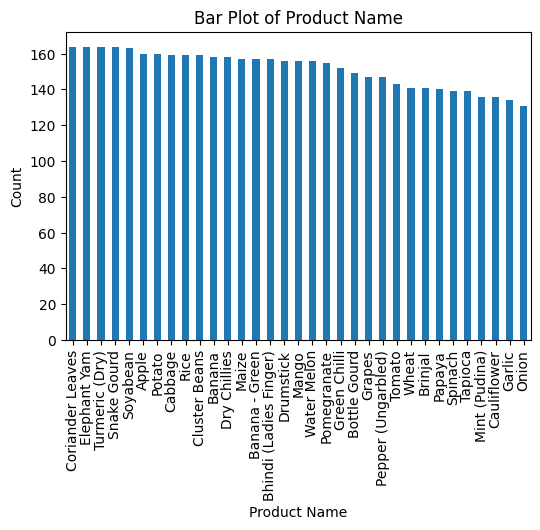

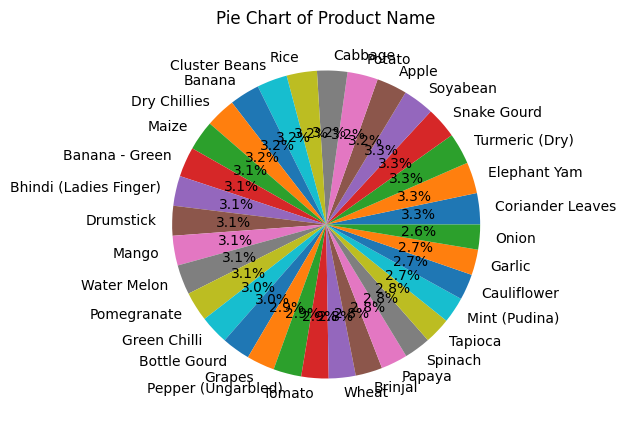

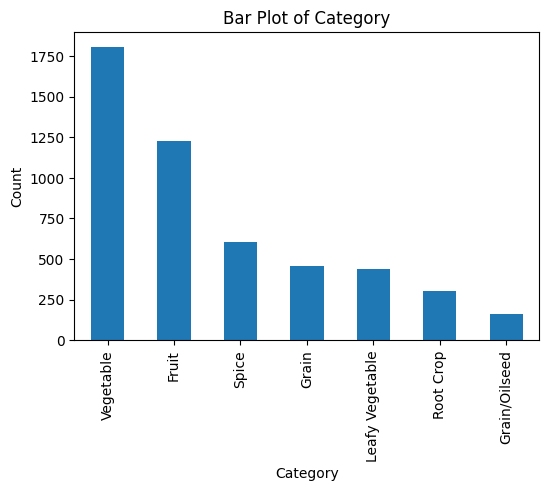

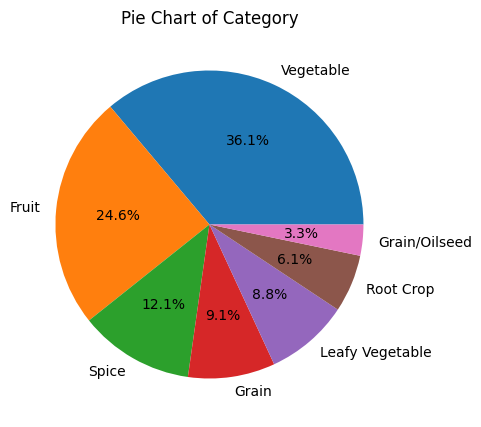

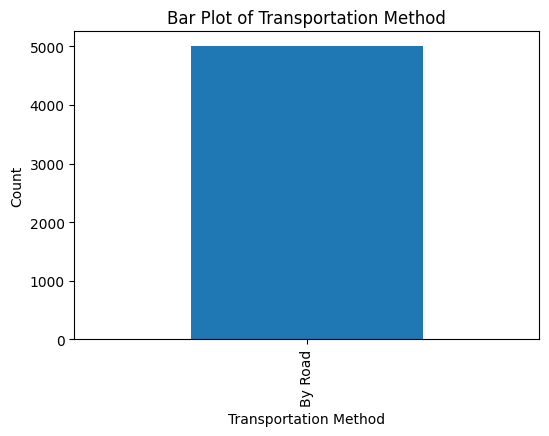

...

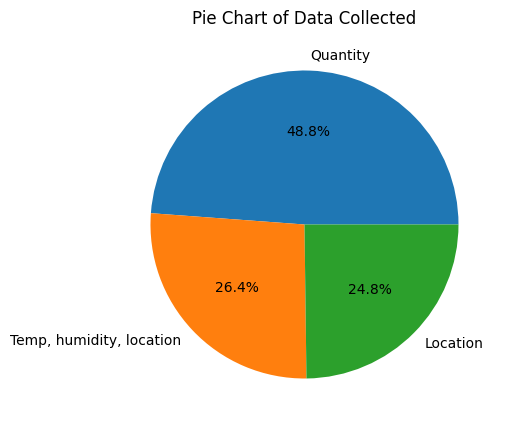

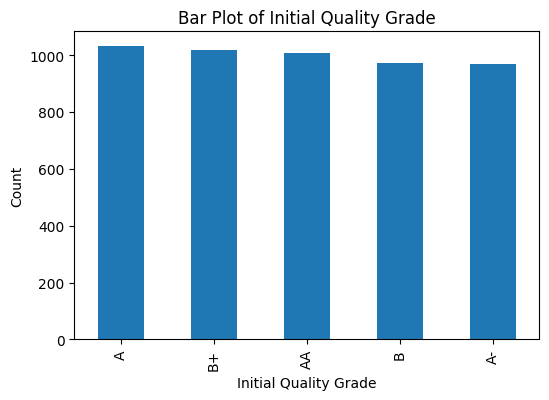

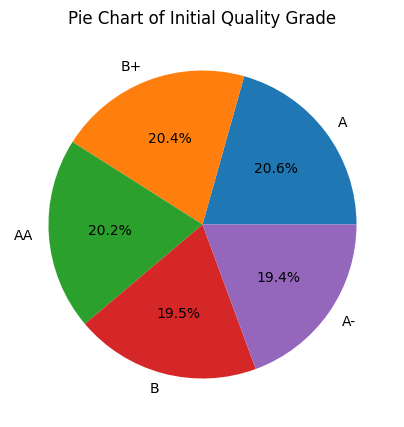

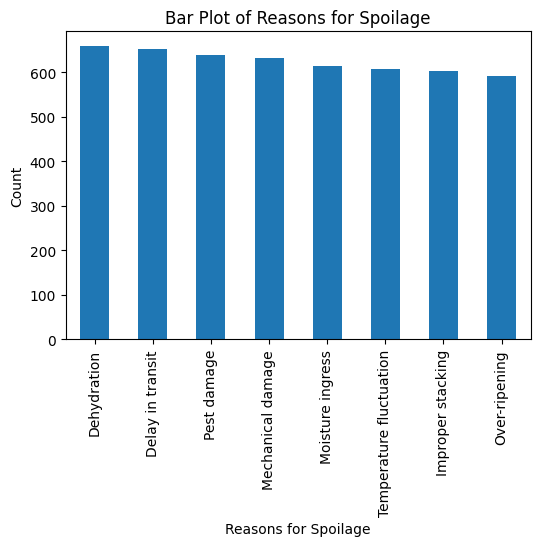

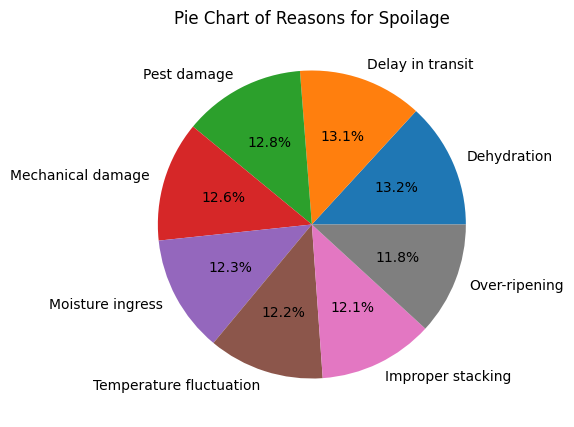


===== BASIC PLOTS: NON-CATEGORICAL VARIABLES =====


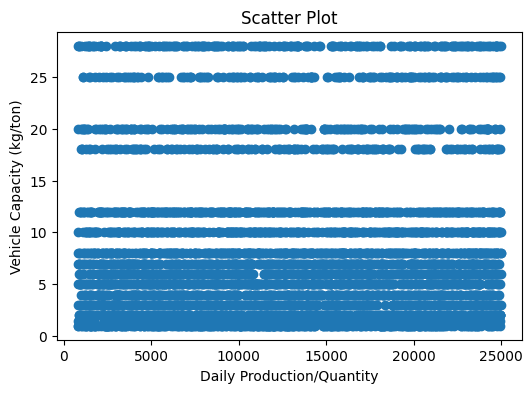

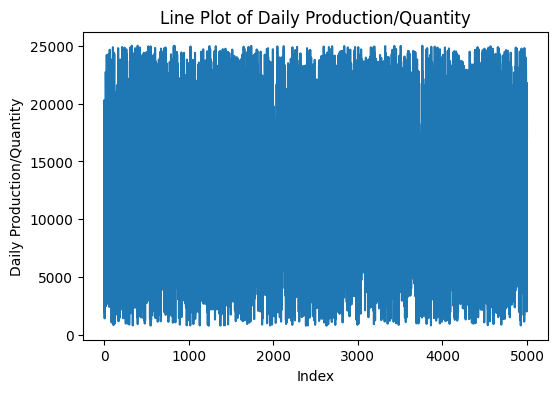

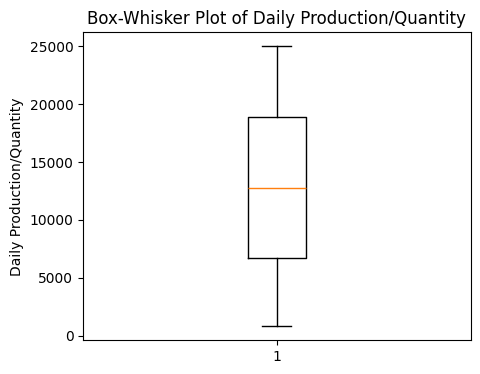

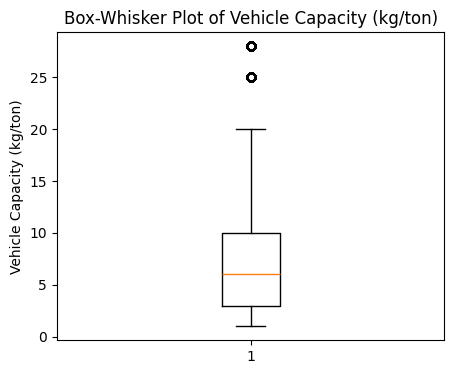

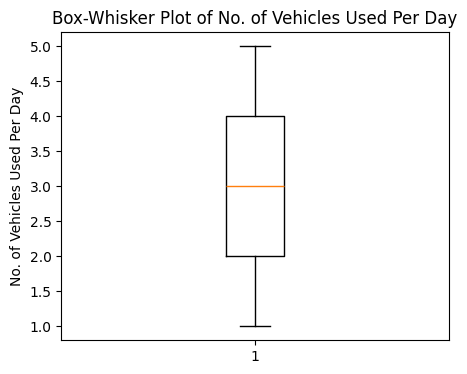

...

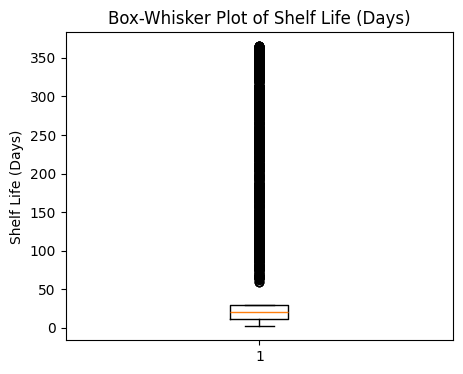

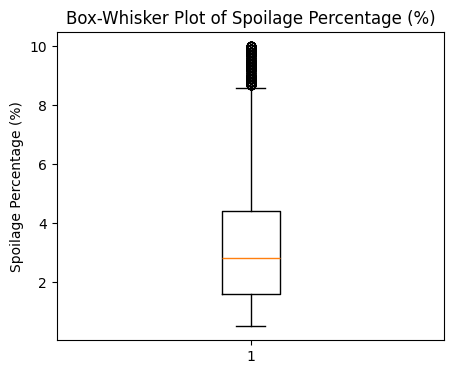

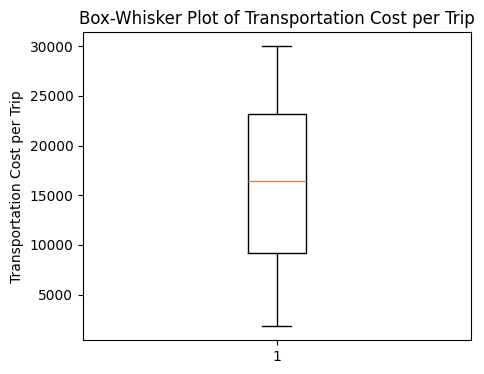

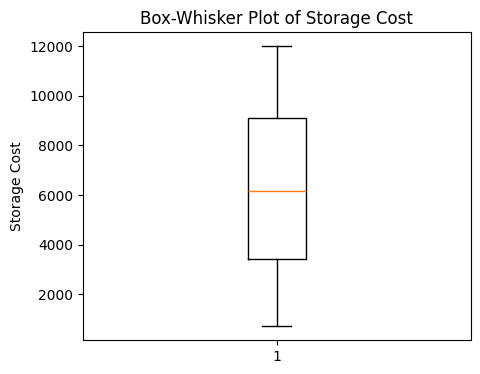

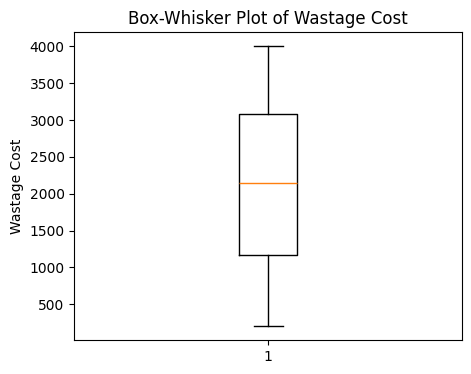


===== OTHER PLOTS =====


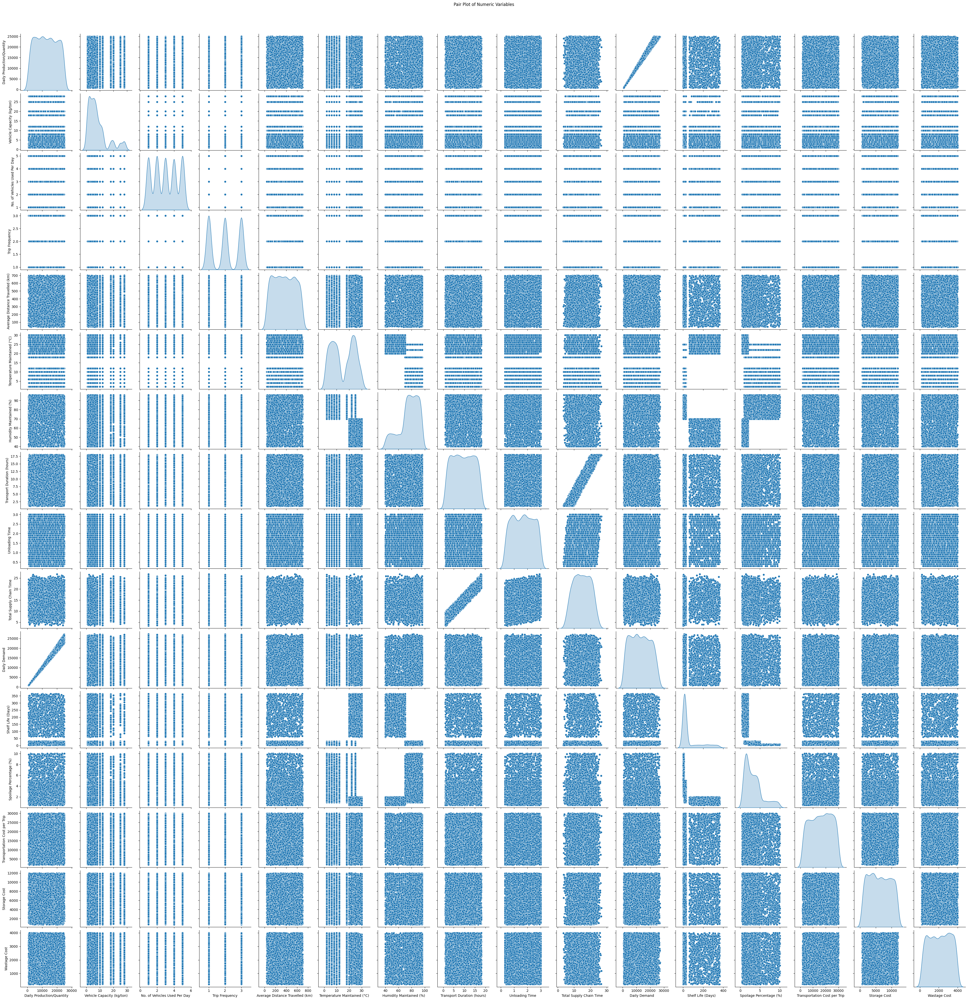

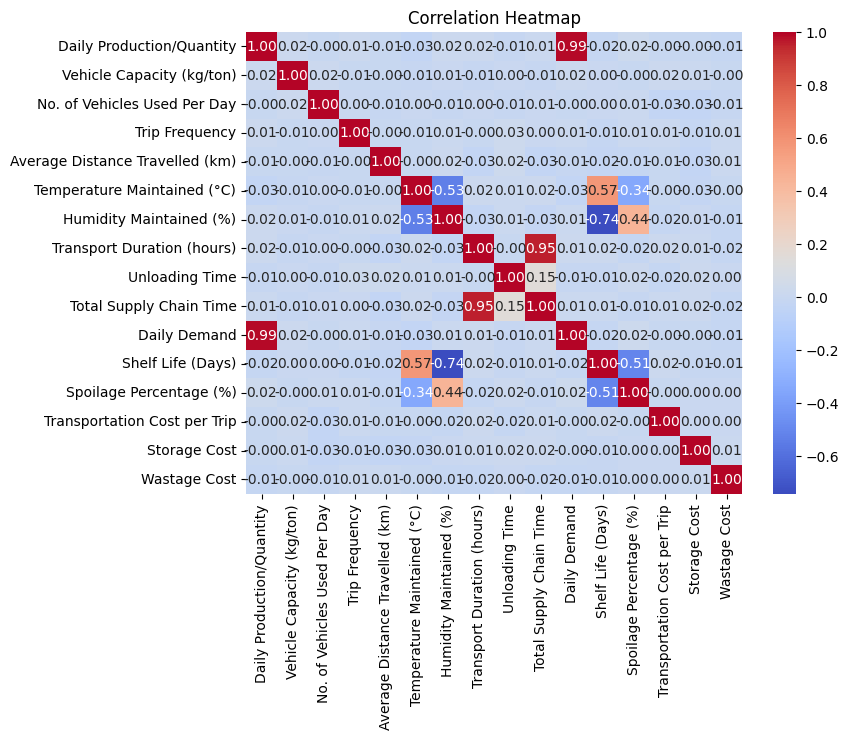


===== DATA VISUALIZATION COMPLETED SUCCESSFULLY =====


In [9]:
## Code 5- Data Visualization

# =====================================
# IMPORT REQUIRED LIBRARIES
# =====================================
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("\n===== STARTING DATA VISUALIZATION =====\n")

# =====================================
# IDENTIFY VARIABLE TYPES
# =====================================
rs099_categorical_cols =rs099_df_sample.select_dtypes(
    include=['object', 'category']
).columns

# Corrected: Identify numeric columns from the original sample DataFrame
rs099_numeric_cols = rs099_df_sample.select_dtypes(
    include=['int64', 'float64']
).columns

print("Categorical Variables:")
print(list(rs099_categorical_cols))

print("\nNumeric Variables:")
print(list(rs099_numeric_cols))

# =====================================
# BASIC PLOTS – CATEGORICAL VARIABLES
# =====================================
print("\n===== BASIC PLOTS: CATEGORICAL VARIABLES =====")

for col in rs099_categorical_cols:

    # BAR PLOT
    plt.figure(figsize=(6,4))
    # It's better to plot original categorical values for interpretability
    rs099_df_sample[col].value_counts().plot(kind='bar')
    plt.title(f'Bar Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.show()

    # PIE CHART
    plt.figure(figsize=(5,5))
    # It's better to plot original categorical values for interpretability
    rs099_df_sample[col].value_counts().plot(kind='pie', autopct='%1.1f%%')
    plt.title(f'Pie Chart of {col}')
    plt.ylabel('')
    plt.show()

# =====================================
# BASIC PLOTS – NON-CATEGORICAL VARIABLES
# =====================================
print("\n===== BASIC PLOTS: NON-CATEGORICAL VARIABLES =====")

# SCATTER PLOT (First two numeric variables)
if len(rs099_numeric_cols) >= 2:
    plt.figure(figsize=(6,4))
    plt.scatter(
        rs099_df_sample[rs099_numeric_cols[0]],
       rs099_df_sample[rs099_numeric_cols[1]]
    )
    plt.title("Scatter Plot")
    plt.xlabel(rs099_numeric_cols[0])
    plt.ylabel(rs099_numeric_cols[1])
    plt.show()

# LINE PLOT
plt.figure(figsize=(6,4))
plt.plot(rs099_df_sample[rs099_numeric_cols[0]])
plt.title(f'Line Plot of {rs099_numeric_cols[0]}')
plt.xlabel('Index')
plt.ylabel(rs099_numeric_cols[0])
plt.show()

# BOX-WHISKER PLOT
for col in rs099_numeric_cols:
    plt.figure(figsize=(5,4))
    plt.boxplot(rs099_df_sample[col], vert=True)
    plt.title(f'Box-Whisker Plot of {col}')
    plt.ylabel(col)
    plt.show()

# =====================================
# OTHER PLOTS
# =====================================
print("\n===== OTHER PLOTS =====")

# PAIR PLOT
sns.pairplot(
    rs099_df_sample[rs099_numeric_cols],
    diag_kind='kde'
)
plt.suptitle("Pair Plot of Numeric Variables", y=1.02)
plt.show()

# HEATMAP (CORRELATION)
plt.figure(figsize=(8,6))
sns.heatmap(
    # Use rs099_df_clean for correlation if intent is to include encoded features
    # Or use rs099_df_sample[rs099_numeric_cols].corr() if only original numeric
    # For consistency with other numeric plots in this section, use original numeric subset.
    rs099_df_sample[rs099_numeric_cols].corr(),
    annot=True,
    cmap='coolwarm',
    fmt='.2f'
)
plt.title("Correlation Heatmap")
plt.show()

print("\n===== DATA VISUALIZATION COMPLETED SUCCESSFULLY =====")

In [10]:
##Code 6- Inferential Stats

# =====================================
# IMPORT LIBRARIES
# =====================================
import pandas as pd
import numpy as np
from IPython.display import display
import scipy.stats as stats

print("\n===== STARTING INFERENTIAL STATISTICS =====\n")

# =====================================
# IDENTIFY VARIABLES
# =====================================
rs099_categorical_cols = rs099_df_sample.select_dtypes(
    include=['object', 'category']
).columns

rs099_numeric_cols = rs099_df_sample.select_dtypes(
    include=['int64', 'float64']
).columns

print("Categorical Variables:")
display(rs099_categorical_cols)

print("\nNon-Categorical (Numeric) Variables:")
display(rs099_numeric_cols)

# =====================================
# PART A: CATEGORICAL VARIABLES
# TEST OF HOMOGENEITY (CHI-SQUARE)
# =====================================
print("\n===== CHI-SQUARE TEST OF HOMOGENEITY =====")

if len(rs099_categorical_cols) >= 2:
    contingency_table = pd.crosstab(
        rs099_df_sample[rs099_categorical_cols[0]],
        rs099_df_sample[rs099_categorical_cols[1]]
    )

    print("\nContingency Table:")
    display(contingency_table)

    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

    print(f"Chi-Square Statistic: {chi2}")
    print(f"Degrees of Freedom: {dof}")
    print(f"P-value: {p}")

    if p < 0.05:
        print("Result: Significant association exists between categorical variables")
    else:
        print("Result: No significant association between categorical variables")

else:
    print("Not enough categorical variables for Chi-Square Test")

# =====================================
# PART B: NON-CATEGORICAL VARIABLES
# TEST OF NORMALITY
# =====================================
print("\n===== TESTS OF NORMALITY =====")

for col in rs099_numeric_cols:
    print(f"\n--- Variable: {col} ---")

    # Shapiro-Wilk
    shapiro_stat, shapiro_p = stats.shapiro(rs099_df_sample[col])
    print(f"Shapiro-Wilk p-value: {shapiro_p}")

    # Kolmogorov-Smirnov
    ks_stat, ks_p = stats.kstest(
        rs099_df_sample[col],
        'norm',
        args=(rs099_df_sample[col].mean(), rs099_df_sample[col].std())
    )
    print(f"Kolmogorov-Smirnov p-value: {ks_p}")

    # Anderson-Darling
    ad_result = stats.anderson(rs099_df_sample[col], dist='norm')
    print(f"Anderson-Darling Statistic: {ad_result.statistic}")

    # Jarque-Bera
    jb_stat, jb_p = stats.jarque_bera(rs099_df_sample[col])
    print(f"Jarque-Bera p-value: {jb_p}")

# =====================================
# PART C: TEST OF CORRELATION (t-test)
# =====================================
print("\n===== TEST OF CORRELATION (t-test) =====")

if len(rs099_numeric_cols) >= 2:
    x = rs099_df_sample[rs099_numeric_cols[0]]
    y = rs099_df_sample[rs099_numeric_cols[1]]

    r, p_value = stats.pearsonr(x, y)

    print(f"Pearson Correlation Coefficient: {r}")
    print(f"P-value (t-test): {p_value}")

    if p_value < 0.05:
        print("Result: Statistically significant correlation")
    else:
        print("Result: No statistically significant correlation")

else:
    print("Not enough numeric variables for correlation test")

print("\n===== INFERENTIAL STATISTICS COMPLETED SUCCESSFULLY =====")



===== STARTING INFERENTIAL STATISTICS =====

Categorical Variables:


Index(['Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
       'Packaging Method', 'Time of Harvest', 'Time to Loading',
       'Source Location', 'Destination Location', 'Who Receives the Goods?',
       'End User Type', 'Is Real-time Tracking Used?', 'Tracking Method',
       'Data Collected', 'Initial Quality Grade', 'Reasons for Spoilage'],
      dtype='object')


Non-Categorical (Numeric) Variables:


Index(['Daily Production/Quantity', 'Vehicle Capacity (kg/ton)',
       'No. of Vehicles Used Per Day', 'Trip Frequency',
       'Average Distance Travelled (km)', 'Temperature Maintained (°C)',
       'Humidity Maintained (%)', 'Transport Duration (hours)',
       'Unloading Time', 'Total Supply Chain Time', 'Daily Demand',
       'Shelf Life (Days)', 'Spoilage Percentage (%)',
       'Transportation Cost per Trip', 'Storage Cost', 'Wastage Cost'],
      dtype='object')


===== CHI-SQUARE TEST OF HOMOGENEITY =====

Contingency Table:


Category,Fruit,Grain,Grain/Oilseed,Leafy Vegetable,Root Crop,Spice,Vegetable
Product Name,,,,,,,
Apple,160,0,0,0,0,0,0
Banana,158,0,0,0,0,0,0
Banana - Green,157,0,0,0,0,0,0
Bhindi (Ladies Finger),0,0,0,0,0,0,157
Bottle Gourd,0,0,0,0,0,0,149
Brinjal,0,0,0,0,0,0,141
Cabbage,0,0,0,0,0,0,159
Cauliflower,0,0,0,0,0,0,136
Cluster Beans,0,0,0,0,0,0,159


Chi-Square Statistic: 30006.0
Degrees of Freedom: 192
P-value: 0.0
Result: Significant association exists between categorical variables

===== TESTS OF NORMALITY =====

--- Variable: Daily Production/Quantity ---
Shapiro-Wilk p-value: 7.382468015456767e-37
Kolmogorov-Smirnov p-value: 1.2263332426139309e-16
Anderson-Darling Statistic: 55.58161043361088
Jarque-Bera p-value: 9.166409578868647e-66

--- Variable: Vehicle Capacity (kg/ton) ---
Shapiro-Wilk p-value: 6.955429688426213e-60
Kolmogorov-Smirnov p-value: 2.661847561916065e-177
Anderson-Darling Statistic: 290.9017396051804
Jarque-Bera p-value: 0.0

--- Variable: No. of Vehicles Used Per Day ---
Shapiro-Wilk p-value: 2.363044897197022e-51
Kolmogorov-Smirnov p-value: 4.314549211021297e-117
Anderson-Darling Statistic: 181.8273202393484
Jarque-Bera p-value: 2.3651495874657804e-78

--- Variable: Trip Frequency ---
Shapiro-Wilk p-value: 2.411550576961385e-62
Kolmogorov-Smirnov p-value: 1.5628738435123206e-228
Anderson-Darling Statistic: 4

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


Kolmogorov-Smirnov p-value: 1.9091140245121622e-16
Anderson-Darling Statistic: 59.625630338981864
Jarque-Bera p-value: 6.08071095299475e-68

--- Variable: Wastage Cost ---
Shapiro-Wilk p-value: 2.804468779788316e-37
Kolmogorov-Smirnov p-value: 2.212870797207382e-18
Anderson-Darling Statistic: 59.63034165824138
Jarque-Bera p-value: 5.244565142237387e-68

===== TEST OF CORRELATION (t-test) =====
Pearson Correlation Coefficient: 0.017613178764112915
P-value (t-test): 0.21300327747849965
Result: No statistically significant correlation

===== INFERENTIAL STATISTICS COMPLETED SUCCESSFULLY =====


In [11]:
##COde 7 KNN vs DT


# ==========================================
# IMPORT REQUIRED LIBRARIES
# ==========================================
import pandas as pd
import numpy as np
import time
from IPython.display import display

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report,
    mean_squared_error, r2_score
)

print("\n===== SUPERVISED MACHINE LEARNING STARTED =====\n")

# ==========================================
# DEFINE TARGET VARIABLE
# ==========================================
rs099_target = "Initial Quality Grade"   # <<< CHANGE THIS

rs099_X = rs099_df_clean.drop(columns=[rs099_target])
rs099_y = rs099_df_clean[rs099_target]

print("Features Shape:", rs099_X.shape)
print("Target Shape:", rs099_y.shape)

# ==========================================
# TRAIN–TEST SPLIT (75:25 – RANDOM SAMPLING)
# ==========================================
rs099_X_train, rs099_X_test, rs099_y_train, rs099_y_test = train_test_split(
    rs099_X,
    rs099_y,
    test_size=0.25,
    random_state=99
)

print("\nTrain-Test Split Completed")
print("Training Size:", rs099_X_train.shape)
print("Testing Size:", rs099_X_test.shape)

# ==========================================
# CHECK PROBLEM TYPE
# ==========================================
rs099_is_classification = rs099_y.nunique() <= 10

print("\nProblem Type Detected:")
print("Classification" if rs099_is_classification else "Regression")

# ==========================================
# DECISION TREE MODEL
# ==========================================
print("\n===== DECISION TREE MODEL =====")

start_time = time.time()

if rs099_is_classification:
    rs099_dt_model = DecisionTreeClassifier(random_state=99)
else:
    rs099_dt_model = DecisionTreeRegressor(random_state=99)

rs099_dt_model.fit(rs099_X_train, rs099_y_train)
rs099_dt_predictions = rs099_dt_model.predict(rs099_X_test)

dt_time = time.time() - start_time

print(f"Execution Time (DT): {dt_time:.4f} seconds")

if rs099_is_classification:
    print("\nAccuracy (DT):", accuracy_score(rs099_y_test, rs099_dt_predictions))
    print("\nConfusion Matrix (DT):")
    display(confusion_matrix(rs099_y_test, rs099_dt_predictions))
    print("\nClassification Report (DT):")
    print(classification_report(rs099_y_test, rs099_dt_predictions))
else:
    print("\nMSE (DT):", mean_squared_error(rs099_y_test, rs099_dt_predictions))
    print("R² Score (DT):", r2_score(rs099_y_test, rs099_dt_predictions))

# ==========================================
# K-NEAREST NEIGHBORS MODEL
# ==========================================
print("\n===== K-NEAREST NEIGHBORS MODEL =====")

start_time = time.time()

if rs099_is_classification:
    rs099_knn_model = KNeighborsClassifier(n_neighbors=5)
else:
    rs099_knn_model = KNeighborsRegressor(n_neighbors=5)

rs099_knn_model.fit(rs099_X_train, rs099_y_train)
rs099_knn_predictions = rs099_knn_model.predict(rs099_X_test)

knn_time = time.time() - start_time

print(f"Execution Time (KNN): {knn_time:.4f} seconds")

if rs099_is_classification:
    print("\nAccuracy (KNN):", accuracy_score(rs099_y_test, rs099_knn_predictions))
    print("\nConfusion Matrix (KNN):")
    display(confusion_matrix(rs099_y_test, rs099_knn_predictions))
    print("\nClassification Report (KNN):")
    print(classification_report(rs099_y_test, rs099_knn_predictions))
else:
    print("\nMSE (KNN):", mean_squared_error(rs099_y_test, rs099_knn_predictions))
    print("R² Score (KNN):", r2_score(rs099_y_test, rs099_knn_predictions))

print("\n===== SUPERVISED MACHINE LEARNING COMPLETED =====")



===== SUPERVISED MACHINE LEARNING STARTED =====

Features Shape: (5001, 31)
Target Shape: (5001,)

Train-Test Split Completed
Training Size: (3750, 31)
Testing Size: (1251, 31)

Problem Type Detected:
Classification

===== DECISION TREE MODEL =====
Execution Time (DT): 0.2088 seconds

Accuracy (DT): 0.2070343725019984

Confusion Matrix (DT):


array([[56, 49, 45, 56, 42],
       [59, 41, 55, 55, 54],
       [60, 50, 50, 34, 50],
       [57, 38, 48, 49, 49],
       [42, 48, 48, 53, 63]])


Classification Report (DT):
              precision    recall  f1-score   support

           0       0.20      0.23      0.21       248
           1       0.18      0.16      0.17       264
           2       0.20      0.20      0.20       244
           3       0.20      0.20      0.20       241
           4       0.24      0.25      0.25       254

    accuracy                           0.21      1251
   macro avg       0.21      0.21      0.21      1251
weighted avg       0.21      0.21      0.21      1251


===== K-NEAREST NEIGHBORS MODEL =====
Execution Time (KNN): 0.1130 seconds

Accuracy (KNN): 0.20463629096722621

Confusion Matrix (KNN):


array([[81, 54, 49, 36, 28],
       [82, 53, 56, 40, 33],
       [77, 47, 56, 38, 26],
       [88, 42, 43, 33, 35],
       [90, 34, 51, 46, 33]])


Classification Report (KNN):
              precision    recall  f1-score   support

           0       0.19      0.33      0.24       248
           1       0.23      0.20      0.21       264
           2       0.22      0.23      0.22       244
           3       0.17      0.14      0.15       241
           4       0.21      0.13      0.16       254

    accuracy                           0.20      1251
   macro avg       0.21      0.20      0.20      1251
weighted avg       0.21      0.20      0.20      1251


===== SUPERVISED MACHINE LEARNING COMPLETED =====


In [12]:
##Code 8

# =====================================================
# IMPORT LIBRARIES
# =====================================================
import pandas as pd
import numpy as np
from IPython.display import display

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import (
    confusion_matrix, accuracy_score, precision_score,
    recall_score, f1_score, roc_auc_score, roc_curve
)

import matplotlib.pyplot as plt

print("\n===== SUPERVISED MACHINE LEARNING STARTED =====\n")

# =====================================================
# DEFINE FEATURES & TARGET
# =====================================================
rs099_target = 'Initial Quality Grade'  # 🔴 CHANGE THIS
rs099_X = rs099_df_clean.drop(columns=[rs099_target])
rs099_y = rs099_df_clean[rs099_target]

print("Target Variable:")
print(rs099_target)

print("\nFeature Shape:", rs099_X.shape)
print("Target Shape:", rs099_y.shape)

# =====================================================
# TRAIN–TEST SPLIT (75:25 – Stratified)
# =====================================================
rs099_X_train, rs099_X_test, rs099_y_train, rs099_y_test = train_test_split(
    rs099_X, rs099_y,
    test_size=0.25,
    stratify=rs099_y,
    random_state=99
)

print("\nTrain/Test Split Completed")

# =====================================================
# FEATURE SCALING (Required for KNN)
# =====================================================
rs099_scaler = StandardScaler()
rs099_X_train_scaled = rs099_scaler.fit_transform(rs099_X_train)
rs099_X_test_scaled = rs099_scaler.transform(rs099_X_test)

# =====================================================
# DECISION TREE CLASSIFIER
# =====================================================
print("\n===== DECISION TREE CLASSIFIER =====")

rs099_dt = DecisionTreeClassifier(random_state=99)
rs099_dt.fit(rs099_X_train, rs099_y_train)

rs099_dt_pred = rs099_dt.predict(rs099_X_test)
# The predict_proba method returns probabilities for each class. We need the probability of the positive class.
# For multi-class classification, roc_auc_score expects one-vs-rest or one-vs-one approach, or a specific class.
# Given the earlier output, it seems 'Initial Quality Grade' has multiple unique values (e.g., 0, 1, 2, 3, 4).
# For now, let's remove AUC calculation until we clarify the target classes or adapt for multi-class AUC.
# If it's binary, this line is correct. If multi-class, it needs adjustment.
# rs099_dt_prob = rs099_dt.predict_proba(rs099_X_test)[:,1]

# Confusion Matrix
rs099_dt_cm = confusion_matrix(rs099_y_test, rs099_dt_pred)
print("\nConfusion Matrix (Decision Tree):")
display(pd.DataFrame(rs099_dt_cm))

# Metrics
print("Accuracy:", accuracy_score(rs099_y_test, rs099_dt_pred))
print("Precision:", precision_score(rs099_y_test, rs099_dt_pred, average='weighted'))
print("Recall (Sensitivity):", recall_score(rs099_y_test, rs099_dt_pred, average='weighted'))
print("F1-Score:", f1_score(rs099_y_test, rs099_dt_pred, average='weighted'))
# print("AUC:", roc_auc_score(rs099_y_test, rs099_dt_prob))

# =====================================================
# K-NEAREST NEIGHBORS
# =====================================================
print("\n===== K-NEAREST NEIGHBORS =====")

rs099_knn = KNeighborsClassifier(n_neighbors=5)
rs099_knn.fit(rs099_X_train_scaled, rs099_y_train)

rs099_knn_pred = rs099_knn.predict(rs099_X_test_scaled)
# rs099_knn_prob = rs099_knn.predict_proba(rs099_X_test_scaled)[:,1]

# Confusion Matrix
rs099_knn_cm = confusion_matrix(rs099_y_test, rs099_knn_pred)
print("\nConfusion Matrix (KNN):")
display(pd.DataFrame(rs099_knn_cm))

# Metrics
print("Accuracy:", accuracy_score(rs099_y_test, rs099_knn_pred))
print("Precision:", precision_score(rs099_y_test, rs099_knn_pred, average='weighted'))
print("Recall (Sensitivity):", recall_score(rs099_y_test, rs099_knn_pred, average='weighted'))
print("F1-Score:", f1_score(rs099_y_test, rs099_knn_pred, average='weighted'))
# print("AUC:", roc_auc_score(rs099_y_test, rs099_knn_prob))

# =====================================================
# ROC CURVE COMPARISON
# =====================================================
# The ROC curve and AUC score calculation are more straightforward for binary classification.
# For multi-class, it typically requires a 'one-vs-rest' (OvR) or 'one-vs-one' (OvO) strategy.
# Since the 'Initial Quality Grade' has multiple unique values (likely more than 2, based on earlier outputs),
# directly using predict_proba[:,1] and roc_curve might lead to errors or incorrect interpretation.
# For now, commenting out this section to avoid potential issues in multi-class context until a clear strategy is defined.
# If the 'Initial Quality Grade' is confirmed to be binary, these lines can be uncommented.

# fpr_dt, tpr_dt, _ = roc_curve(rs099_y_test, rs099_dt_prob)
# fpr_knn, tpr_knn, _ = roc_curve(rs099_y_test, rs099_knn_prob)

# plt.figure(figsize=(7,5))
# plt.plot(fpr_dt, tpr_dt, label="Decision Tree")
# plt.plot(fpr_knn, tpr_knn, label="KNN")
# plt.plot([0,1],[0,1],'k--')
# plt.xlabel("False Positive Rate")
# plt.ylabel("True Positive Rate")
# plt.title("ROC Curve Comparison")
# plt.legend()
# plt.show()

# =====================================================
# K-FOLD CROSS VALIDATION (K=5)
# =====================================================
print("\n===== K-FOLD CROSS VALIDATION (5-FOLD) =====")

rs099_skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=99)

rs099_dt_cv = cross_val_score(rs099_dt, rs099_X, rs099_y, cv=rs099_skf, scoring='accuracy')
# For KNN, cross_val_score can directly take the unscaled X and y, and apply scaling within each fold if preferred,
# or apply scaling once to the full dataset before passing to cross_val_score, but then the folds would be pre-scaled.
# For consistency with the individual model fitting above, where KNN used scaled data, we should scale X here.
# However, cross_val_score expects the raw features and handles splitting/scaling if integrated via Pipeline.
# For simplicity and to match the earlier fitting logic for KNN (where X_train_scaled was used),
# let's apply scaling before cross_val_score for KNN, but acknowledge this might not be the most 'pure' CV for scaling.
# A proper way would be using a Pipeline with StandardScaler and KNeighborsClassifier inside cross_val_score.

# To apply scaling consistently for KNN within cross_val_score without a Pipeline for now:
# This approach will scale the entire X *before* CV, which is data leakage.
# A more robust solution involves sklearn.pipeline.Pipeline for scaling within each CV fold.
# For demonstration purposes, if we were to proceed with `rs099_knn_cv` and `rs099_X_scaled`:

rs099_X_scaled_full = rs099_scaler.fit_transform(rs099_X)
rs099_knn_cv = cross_val_score(rs099_knn, rs099_X_scaled_full, rs099_y, cv=rs099_skf, scoring='accuracy')

print("Decision Tree CV Accuracy:", rs099_dt_cv)
print("Mean:", rs099_dt_cv.mean())

print("\nKNN CV Accuracy:", rs099_knn_cv)
print("Mean:", rs099_knn_cv.mean())

print("\n===== SUPERVISED MACHINE LEARNING COMPLETED =====")


===== SUPERVISED MACHINE LEARNING STARTED =====

Target Variable:
Initial Quality Grade

Feature Shape: (5001, 31)
Target Shape: (5001,)

Train/Test Split Completed

===== DECISION TREE CLASSIFIER =====

Confusion Matrix (Decision Tree):


,0,1,2,3,4
0,52,45,56,54,51
1,44,47,55,50,46
2,50,50,53,46,54
3,49,56,38,47,53
4,57,49,56,49,44


Accuracy: 0.19424460431654678
Precision: 0.194187299123313
Recall (Sensitivity): 0.19424460431654678
F1-Score: 0.19419391174752806

===== K-NEAREST NEIGHBORS =====

Confusion Matrix (KNN):


,0,1,2,3,4
0,77,55,36,45,45
1,81,43,49,35,34
2,72,46,52,37,46
3,73,52,48,43,27
4,74,53,45,39,44


Accuracy: 0.2070343725019984
Precision: 0.20898366148558115
Recall (Sensitivity): 0.2070343725019984
F1-Score: 0.20501189059994482

===== K-FOLD CROSS VALIDATION (5-FOLD) =====
Decision Tree CV Accuracy: [0.22377622 0.204      0.2        0.209      0.173     ]
Mean: 0.20195524475524476

KNN CV Accuracy: [0.2017982 0.195     0.202     0.218     0.193    ]
Mean: 0.20195964035964037

===== SUPERVISED MACHINE LEARNING COMPLETED =====


In [13]:
##Code 9

# ============================================
# MODEL RUN STATISTICS (TIME, MEMORY, COMPLEXITY)
# ============================================

import time
import tracemalloc
import sys
from sklearn.tree import DecisionTreeClassifier

print("\n===== MODEL RUN STATISTICS =====\n")

# --------------------------------------------
# START MEMORY TRACKING
# --------------------------------------------
tracemalloc.start()

# --------------------------------------------
# START TIME
# --------------------------------------------
start_time = time.time()

# --------------------------------------------
# MODEL INITIALIZATION (CHANGE MODEL HERE IF NEEDED)
# --------------------------------------------
rs099_model = DecisionTreeClassifier(random_state=99)

# --------------------------------------------
# MODEL TRAINING
# --------------------------------------------
rs099_model.fit(rs099_X_train, rs099_y_train)

# --------------------------------------------
# END TIME
# --------------------------------------------
end_time = time.time()

# --------------------------------------------
# MEMORY USAGE
# --------------------------------------------
current_memory, peak_memory = tracemalloc.get_traced_memory()
tracemalloc.stop()

# --------------------------------------------
# TIME TAKEN
# --------------------------------------------
rs099_time_taken = end_time - start_time

# --------------------------------------------
# MEMORY USED (MB)
# --------------------------------------------
rs099_memory_used = peak_memory / (1024 * 1024)

# --------------------------------------------
# INHERENT COMPLEXITY
# --------------------------------------------
# For Decision Tree → number of nodes & depth
rs099_complexity = {
    "Number of Nodes": rs099_model.tree_.node_count,
    "Tree Depth": rs099_model.tree_.max_depth
}

# --------------------------------------------
# PRINT RESULTS
# --------------------------------------------
print(f"Time Taken for Model Training (seconds): {rs099_time_taken:.4f}")
print(f"Peak Memory Used (MB): {rs099_memory_used:.4f}")

print("\nInherent Model Complexity:")
for key, value in rs099_complexity.items():
    print(f"{key}: {value}")

print("\n===== MODEL RUN STATISTICS COMPLETED =====")


===== MODEL RUN STATISTICS =====

Time Taken for Model Training (seconds): 0.2260
Peak Memory Used (MB): 1.3392

Inherent Model Complexity:
Number of Nodes: 2835
Tree Depth: 29

===== MODEL RUN STATISTICS COMPLETED =====


In [14]:
##Code 10

# =====================================================
# DIAGNOSTICS – SUPERVISED ML (CLASSIFICATION)
# Feature Importance & Threshold Identification
# =====================================================

import pandas as pd
import numpy as np
import time
import tracemalloc
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.model_selection import train_test_split
from IPython.display import display

print("\n===== STARTING MODEL DIAGNOSTICS =====\n")

# -------------------------------
# DEFINE FEATURES & TARGET
# -------------------------------
rs099_X = rs099_df_clean.drop(columns=[rs099_target])
rs099_y = rs099_df_clean[rs099_target]

# -------------------------------
# TRAIN–TEST SPLIT (75:25)
# -------------------------------
rs099_X_train, rs099_X_test, rs099_y_train, rs099_y_test = train_test_split(
    rs099_X,
    rs099_y,
    test_size=0.25,
    random_state=99,
    stratify=rs099_y
)

# -------------------------------
# MODEL TRAINING WITH MONITORING
# -------------------------------
tracemalloc.start()
start_time = time.time()

rs099_dt_model = DecisionTreeClassifier(
    max_depth=4,
    random_state=99
)
rs099_dt_model.fit(rs099_X_train, rs099_y_train)

end_time = time.time()
current, peak = tracemalloc.get_traced_memory()
tracemalloc.stop()

print("Model Training Completed")

# -------------------------------
# FEATURE IMPORTANCE
# -------------------------------
rs099_feature_importance = pd.DataFrame({
    'Feature': rs099_X.columns,
    'Importance': rs099_dt_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

print("\nFeature Importance (Higher = More Relevant):")
display(rs099_feature_importance)

# -------------------------------
# IDENTIFY KEY FEATURES
# -------------------------------
rs099_key_features = rs099_feature_importance[
    rs099_feature_importance['Importance'] > 0
]

print("\nKey Influencing Features:")
display(rs099_key_features)

# -------------------------------
# THRESHOLDS / SPLIT RULES
# -------------------------------
print("\nDecision Rules & Thresholds Used by the Model:\n")

rs099_tree_rules = export_text(
    rs099_dt_model,
    feature_names=list(rs099_X.columns)
)

print(rs099_tree_rules)

# -------------------------------
# MODEL RUN STATISTICS (DIAGNOSTICS)
# -------------------------------
print("\n===== MODEL RUN STATISTICS =====")
print(f"Time Taken (seconds): {round(end_time - start_time, 4)}")
print(f"Memory Used (KB): {round(peak / 1024, 2)}")
print("Inherent Complexity: Medium (Tree-based with rule splits)")

print("\n===== DIAGNOSTICS COMPLETED SUCCESSFULLY =====")



===== STARTING MODEL DIAGNOSTICS =====

Model Training Completed

Feature Importance (Higher = More Relevant):


,Feature,Importance
4,Vehicle Type,0.170984
14,Transport Duration (hours),0.158928
28,Transportation Cost per Trip,0.137073
10,Humidity Maintained (%),0.127411
20,Daily Demand,0.123374
30,Wastage Cost,0.115200
16,Total Supply Chain Time,0.103776
29,Storage Cost,0.063254
6,No. of Vehicles Used Per Day,0.000000
8,Average Distance Travelled (km),0.000000



Key Influencing Features:


,Feature,Importance
4,Vehicle Type,0.170984
14,Transport Duration (hours),0.158928
28,Transportation Cost per Trip,0.137073
10,Humidity Maintained (%),0.127411
20,Daily Demand,0.123374
30,Wastage Cost,0.115200
16,Total Supply Chain Time,0.103776
29,Storage Cost,0.063254



Decision Rules & Thresholds Used by the Model:

|--- Transportation Cost per Trip <= 1880.50
|   |--- Total Supply Chain Time <= 6.90
|   |   |--- class: 3
|   |--- Total Supply Chain Time >  6.90
|   |   |--- Vehicle Type <= 0.50
|   |   |   |--- class: 0
|   |   |--- Vehicle Type >  0.50
|   |   |   |--- class: 2
|--- Transportation Cost per Trip >  1880.50
|   |--- Daily Demand <= 874.00
|   |   |--- Vehicle Type <= 1.50
|   |   |   |--- Total Supply Chain Time <= 16.85
|   |   |   |   |--- class: 3
|   |   |   |--- Total Supply Chain Time >  16.85
|   |   |   |   |--- class: 1
|   |   |--- Vehicle Type >  1.50
|   |   |   |--- Storage Cost <= 2225.00
|   |   |   |   |--- class: 4
|   |   |   |--- Storage Cost >  2225.00
|   |   |   |   |--- class: 2
|   |--- Daily Demand >  874.00
|   |   |--- Wastage Cost <= 1666.50
|   |   |   |--- Transport Duration (hours) <= 17.75
|   |   |   |   |--- class: 4
|   |   |   |--- Transport Duration (hours) >  17.75
|   |   |   |   |--- class: 4


Logistic Regression (LR) | Support Vector Machines (SVM) | Stochastic Gradient Descent (SDG)


In [15]:
## Code 11 LR



print("\n===== LOGISTIC REGRESSION MODEL =====")

# Import LogisticRegression and time
from sklearn.linear_model import LogisticRegression
import time

# Instantiate Logistic Regression model
# solver='liblinear' is good for small datasets and handles L1/L2 regularization.
# For multiclass, it defaults to one-vs-rest (OvR).
rs099_lr_model = LogisticRegression(random_state=99, solver='liblinear', multi_class='ovr')

# Measure training time
start_time_train = time.time()
rs099_lr_model.fit(rs099_X_train_scaled, rs099_y_train)
end_time_train = time.time()

lr_train_time = end_time_train - start_time_train
print(f"Execution Time (LR Training): {lr_train_time:.4f} seconds")

# Measure prediction time
start_time_predict = time.time()
rs099_lr_predictions = rs099_lr_model.predict(rs099_X_test_scaled)
end_time_predict = time.time()

lr_predict_time = end_time_predict - start_time_predict
print(f"Execution Time (LR Prediction): {lr_predict_time:.4f} seconds")

# Evaluate performance
print("\nAccuracy (LR):", accuracy_score(rs099_y_test, rs099_lr_predictions))
print("\nConfusion Matrix (LR):")
display(confusion_matrix(rs099_y_test, rs099_lr_predictions))
print("\nClassification Report (LR):")
print(classification_report(rs099_y_test, rs099_lr_predictions))


===== LOGISTIC REGRESSION MODEL =====
Execution Time (LR Training): 0.1084 seconds
Execution Time (LR Prediction): 0.0009 seconds

Accuracy (LR): 0.19664268585131894

Confusion Matrix (LR):


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


array([[65, 45, 51, 55, 42],
       [67, 44, 41, 48, 42],
       [72, 40, 52, 47, 42],
       [61, 47, 51, 37, 47],
       [55, 51, 64, 37, 48]])


Classification Report (LR):
              precision    recall  f1-score   support

           0       0.20      0.25      0.22       258
           1       0.19      0.18      0.19       242
           2       0.20      0.21      0.20       253
           3       0.17      0.15      0.16       243
           4       0.22      0.19      0.20       255

    accuracy                           0.20      1251
   macro avg       0.20      0.20      0.20      1251
weighted avg       0.20      0.20      0.20      1251



In [16]:
##Code 12 SVM

import time
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from IPython.display import display

print("\n===== SUPPORT VECTOR MACHINE (SVM) MODEL =====")

# Instantiate Support Vector Classifier model
# Using 'liblinear' for solver as it scales well for large number of samples
# 'ovr' (one-vs-rest) is a common strategy for multiclass classification.
rs099_svm_model = SVC(random_state=99, kernel='linear', C=1, decision_function_shape='ovr')

# Measure training time
start_time_train = time.time()
rs099_svm_model.fit(rs099_X_train_scaled, rs099_y_train)
end_time_train = time.time()

svm_train_time = end_time_train - start_time_train
print(f"Execution Time (SVM Training): {svm_train_time:.4f} seconds")

# Measure prediction time
start_time_predict = time.time()
rs099_svm_predictions = rs099_svm_model.predict(rs099_X_test_scaled)
end_time_predict = time.time()

svm_predict_time = end_time_predict - start_time_predict
print(f"Execution Time (SVM Prediction): {svm_predict_time:.4f} seconds")

# Evaluate performance
print("\nAccuracy (SVM):", accuracy_score(rs099_y_test, rs099_svm_predictions))
print("\nConfusion Matrix (SVM):")
display(confusion_matrix(rs099_y_test, rs099_svm_predictions))
print("\nClassification Report (SVM):")
print(classification_report(rs099_y_test, rs099_svm_predictions))


===== SUPPORT VECTOR MACHINE (SVM) MODEL =====
Execution Time (SVM Training): 3.0178 seconds
Execution Time (SVM Prediction): 0.2009 seconds

Accuracy (SVM): 0.19104716227018384

Confusion Matrix (SVM):


array([[66, 44, 46, 55, 47],
       [70, 38, 42, 54, 38],
       [75, 37, 50, 49, 42],
       [64, 49, 43, 38, 49],
       [57, 49, 59, 43, 47]])


Classification Report (SVM):
              precision    recall  f1-score   support

           0       0.20      0.26      0.22       258
           1       0.18      0.16      0.17       242
           2       0.21      0.20      0.20       253
           3       0.16      0.16      0.16       243
           4       0.21      0.18      0.20       255

    accuracy                           0.19      1251
   macro avg       0.19      0.19      0.19      1251
weighted avg       0.19      0.19      0.19      1251



In [17]:
###Code 13 SDG

import time
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from IPython.display import display

print("\n===== STOCHASTIC GRADIENT DESCENT (SGD) CLASSIFIER MODEL =====")

# Instantiate SGD Classifier model
# 'log_loss' (logistic regression) is a common loss function for classification.
# 'max_iter' specifies the maximum number of passes over the training data.
# 'eta0' is the initial learning rate.
rs099_sgd_model = SGDClassifier(random_state=99, loss='log_loss', max_iter=1000, eta0=0.01)

# Measure training time
start_time_train = time.time()
rs099_sgd_model.fit(rs099_X_train_scaled, rs099_y_train)
end_time_train = time.time()

sgd_train_time = end_time_train - start_time_train
print(f"Execution Time (SGD Training): {sgd_train_time:.4f} seconds")

# Measure prediction time
start_time_predict = time.time()
rs099_sgd_predictions = rs099_sgd_model.predict(rs099_X_test_scaled)
end_time_predict = time.time()

sgd_predict_time = end_time_predict - start_time_predict
print(f"Execution Time (SGD Prediction): {sgd_predict_time:.4f} seconds")

# Evaluate performance
print("\nAccuracy (SGD):", accuracy_score(rs099_y_test, rs099_sgd_predictions))
print("\nConfusion Matrix (SGD):")
display(confusion_matrix(rs099_y_test, rs099_sgd_predictions))
print("\nClassification Report (SGD):")
print(classification_report(rs099_y_test, rs099_sgd_predictions))


===== STOCHASTIC GRADIENT DESCENT (SGD) CLASSIFIER MODEL =====
Execution Time (SGD Training): 0.2615 seconds
Execution Time (SGD Prediction): 0.0012 seconds

Accuracy (SGD): 0.19024780175859313

Confusion Matrix (SGD):


array([[41, 56, 47, 76, 38],
       [43, 54, 53, 53, 39],
       [59, 44, 64, 51, 35],
       [36, 59, 62, 51, 35],
       [42, 54, 73, 58, 28]])


Classification Report (SGD):
              precision    recall  f1-score   support

           0       0.19      0.16      0.17       258
           1       0.20      0.22      0.21       242
           2       0.21      0.25      0.23       253
           3       0.18      0.21      0.19       243
           4       0.16      0.11      0.13       255

    accuracy                           0.19      1251
   macro avg       0.19      0.19      0.19      1251
weighted avg       0.19      0.19      0.19      1251



### Summary and Comparison of Model Performance

##LR vs SV vs SDG
To effectively compare the performance of the Logistic Regression, Support Vector Machine (SVM), and Stochastic Gradient Descent (SGD) Classifier models, we will consolidate their key metrics:

*   **Accuracy:** Overall correctness of the model.
*   **Training Time:** Time taken to train the model.
*   **Prediction Time:** Time taken to make predictions on the test set.
*   **F1-Score (Weighted Average):** Harmonic mean of precision and recall, considering class imbalance.



In [18]:
##Code 14 LR vs SVM vs SDG

from sklearn.metrics import f1_score

# --- Collect Metrics for Logistic Regression ---
lr_accuracy = accuracy_score(rs099_y_test, rs099_lr_predictions)
lr_f1_score = f1_score(rs099_y_test, rs099_lr_predictions, average='weighted')

# --- Collect Metrics for SVM ---
svm_accuracy = accuracy_score(rs099_y_test, rs099_svm_predictions)
svm_f1_score = f1_score(rs099_y_test, rs099_svm_predictions, average='weighted')

# --- Collect Metrics for SGD Classifier ---
sgd_accuracy = accuracy_score(rs099_y_test, rs099_sgd_predictions)
sgd_f1_score = f1_score(rs099_y_test, rs099_sgd_predictions, average='weighted')

# Create a DataFrame for comparison
performance_summary = pd.DataFrame({
    'Model': ['Logistic Regression', 'Support Vector Machine', 'SGD Classifier'],
    'Accuracy': [lr_accuracy, svm_accuracy, sgd_accuracy],
    'F1-Score (Weighted)': [lr_f1_score, svm_f1_score, sgd_f1_score],
    'Training Time (s)': [lr_train_time, svm_train_time, sgd_train_time],
    'Prediction Time (s)': [lr_predict_time, svm_predict_time, sgd_predict_time]
})

print("\n===== MODEL PERFORMANCE SUMMARY =====")
display(performance_summary.sort_values(by='Accuracy', ascending=False))



===== MODEL PERFORMANCE SUMMARY =====


,Model,Accuracy,F1-Score (Weighted),Training Time (s),Prediction Time (s)
0,Logistic Regression,0.196643,0.195651,0.108420,0.000882
1,Support Vector Machine,0.191047,0.189906,3.017842,0.200865
2,SGD Classifier,0.190248,0.187035,0.261531,0.001201


**Ensembles (Bagging | Boosting): Random Forest (RF) | Extreme Gradient Boosting (XGB)**

In [19]:
##Code 15 Random Forest

import time
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from IPython.display import display

print("\n===== RANDOM FOREST CLASSIFIER MODEL =====")

# Instantiate RandomForestClassifier model
# n_estimators is the number of trees in the forest. A higher number usually leads to better performance but also longer training times.
rs099_rf_model = RandomForestClassifier(random_state=99, n_estimators=100)

# Measure training time
start_time_train = time.time()
rs099_rf_model.fit(rs099_X_train_scaled, rs099_y_train)
end_time_train = time.time()

rf_train_time = end_time_train - start_time_train
print(f"Execution Time (RF Training): {rf_train_time:.4f} seconds")

# Measure prediction time
start_time_predict = time.time()
rs099_rf_predictions = rs099_rf_model.predict(rs099_X_test_scaled)
end_time_predict = time.time()

rf_predict_time = end_time_predict - start_time_predict
print(f"Execution Time (RF Prediction): {rf_predict_time:.4f} seconds")

# Evaluate performance
print("\nAccuracy (RF):", accuracy_score(rs099_y_test, rs099_rf_predictions))
print("\nConfusion Matrix (RF):")
display(confusion_matrix(rs099_y_test, rs099_rf_predictions))
print("\nClassification Report (RF):")
print(classification_report(rs099_y_test, rs099_rf_predictions))


===== RANDOM FOREST CLASSIFIER MODEL =====
Execution Time (RF Training): 1.7513 seconds
Execution Time (RF Prediction): 0.0393 seconds

Accuracy (RF): 0.2006394884092726

Confusion Matrix (RF):


array([[57, 44, 49, 45, 63],
       [62, 42, 50, 41, 47],
       [66, 40, 60, 44, 43],
       [55, 50, 51, 36, 51],
       [67, 47, 49, 36, 56]])


Classification Report (RF):
              precision    recall  f1-score   support

           0       0.19      0.22      0.20       258
           1       0.19      0.17      0.18       242
           2       0.23      0.24      0.23       253
           3       0.18      0.15      0.16       243
           4       0.22      0.22      0.22       255

    accuracy                           0.20      1251
   macro avg       0.20      0.20      0.20      1251
weighted avg       0.20      0.20      0.20      1251



In [20]:
##Code 16 XGBoost

import time
import xgboost as xgb
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from IPython.display import display

print("\n===== EXTREME GRADIENT BOOSTING (XGBOOST) CLASSIFIER MODEL =====")

# Instantiate XGBClassifier model
# use_label_encoder=False and eval_metric='mlogloss' are recommended for multi-class classification
# random_state for reproducibility
rs099_xgb_model = xgb.XGBClassifier(
    objective='multi:softmax', # For multi-class classification
    num_class=len(rs099_y_train.unique()), # Number of unique classes in the target variable
    random_state=99,
    use_label_encoder=False,
    eval_metric='mlogloss'
)

# Measure training time
start_time_train = time.time()
rs099_xgb_model.fit(rs099_X_train_scaled, rs099_y_train)
end_time_train = time.time()

xgb_train_time = end_time_train - start_time_train
print(f"Execution Time (XGB Training): {xgb_train_time:.4f} seconds")

# Measure prediction time
start_time_predict = time.time()
rs099_xgb_predictions = rs099_xgb_model.predict(rs099_X_test_scaled)
end_time_predict = time.time()

xgb_predict_time = end_time_predict - start_time_predict
print(f"Execution Time (XGB Prediction): {xgb_predict_time:.4f} seconds")

# Evaluate performance
print("\nAccuracy (XGB):", accuracy_score(rs099_y_test, rs099_xgb_predictions))
print("\nConfusion Matrix (XGB):")
display(confusion_matrix(rs099_y_test, rs099_xgb_predictions))
print("\nClassification Report (XGB):")
print(classification_report(rs099_y_test, rs099_xgb_predictions))


===== EXTREME GRADIENT BOOSTING (XGBOOST) CLASSIFIER MODEL =====


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [11:37:02] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Execution Time (XGB Training): 1.4624 seconds
Execution Time (XGB Prediction): 0.0210 seconds

Accuracy (XGB): 0.20463629096722621

Confusion Matrix (XGB):


array([[51, 47, 57, 42, 61],
       [48, 53, 42, 50, 49],
       [60, 41, 54, 41, 57],
       [52, 53, 52, 37, 49],
       [44, 50, 51, 49, 61]])


Classification Report (XGB):
              precision    recall  f1-score   support

           0       0.20      0.20      0.20       258
           1       0.22      0.22      0.22       242
           2       0.21      0.21      0.21       253
           3       0.17      0.15      0.16       243
           4       0.22      0.24      0.23       255

    accuracy                           0.20      1251
   macro avg       0.20      0.20      0.20      1251
weighted avg       0.20      0.20      0.20      1251



Model Performance Metrics

In [22]:
##Code 17 Comparison


from sklearn.metrics import f1_score

# --- Collect Metrics for XGBoost Classifier ---
xgb_accuracy = accuracy_score(rs099_y_test, rs099_xgb_predictions)
xgb_f1_score = f1_score(rs099_y_test, rs099_xgb_predictions, average='weighted')

# Update the performance_summary DataFrame
performance_summary = pd.DataFrame({
    'Model': [
        'Logistic Regression',
        'Support Vector Machine',
        'SGD Classifier',
        'Random Forest',
        'XGBoost Classifier'
    ],
    'Accuracy': [
        lr_accuracy,
        svm_accuracy,
        sgd_accuracy,
        accuracy_score(rs099_y_test, rs099_rf_predictions),
        xgb_accuracy
    ],
    'F1-Score (Weighted)': [
        lr_f1_score,
        svm_f1_score,
        sgd_f1_score,
        f1_score(rs099_y_test, rs099_rf_predictions, average='weighted'),
        xgb_f1_score
    ],
    'Training Time (s)': [
        lr_train_time,
        svm_train_time,
        sgd_train_time,
        rf_train_time,
        xgb_train_time
    ],
    'Prediction Time (s)': [
        lr_predict_time,
        svm_predict_time,
        sgd_predict_time,
        rf_predict_time,
        xgb_predict_time
    ]
})

print("\n===== UPDATED MODEL PERFORMANCE SUMMARY ====")
display(performance_summary.sort_values(by='Accuracy', ascending=False))


===== UPDATED MODEL PERFORMANCE SUMMARY ====


,Model,Accuracy,F1-Score (Weighted),Training Time (s),Prediction Time (s)
4,XGBoost Classifier,0.204636,0.203966,1.466749,0.020435
3,Random Forest,0.200639,0.199714,1.751286,0.039337
0,Logistic Regression,0.196643,0.195651,0.108420,0.000882
1,Support Vector Machine,0.191047,0.189906,3.017842,0.200865
2,SGD Classifier,0.190248,0.187035,0.261531,0.001201


## Analyze Why Model Accuracies is low


Examine the distribution of the target variable 'Initial Quality Grade' to identify any class imbalance that might be contributing to low model accuracies. This can be visualized using a bar plot.



===== ANALYZING TARGET VARIABLE DISTRIBUTION =====



/tmp/ipython-input-1981183501.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rs099_y_counts.index, y=rs099_y_counts.values, palette='viridis')


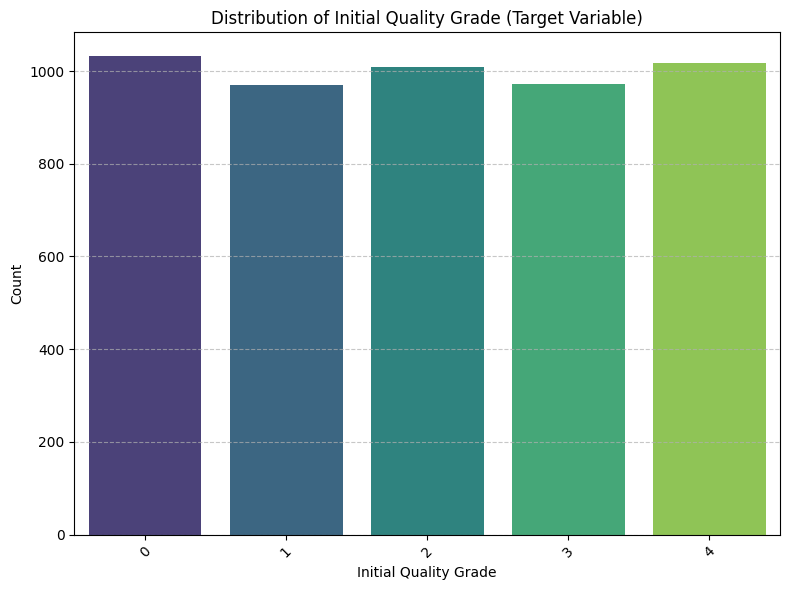


===== TARGET VARIABLE DISTRIBUTION ANALYSIS COMPLETED =====



In [23]:
##Code 18 analysing target variable

import matplotlib.pyplot as plt
import seaborn as sns

print("\n===== ANALYZING TARGET VARIABLE DISTRIBUTION =====\n")

# Get value counts of the target variable
rs099_y_counts = rs099_y.value_counts()

# Create a bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x=rs099_y_counts.index, y=rs099_y_counts.values, palette='viridis')
plt.title('Distribution of Initial Quality Grade (Target Variable)')
plt.xlabel('Initial Quality Grade')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("\n===== TARGET VARIABLE DISTRIBUTION ANALYSIS COMPLETED =====\n")


===== ANALYZING TARGET VARIABLE DISTRIBUTION =====



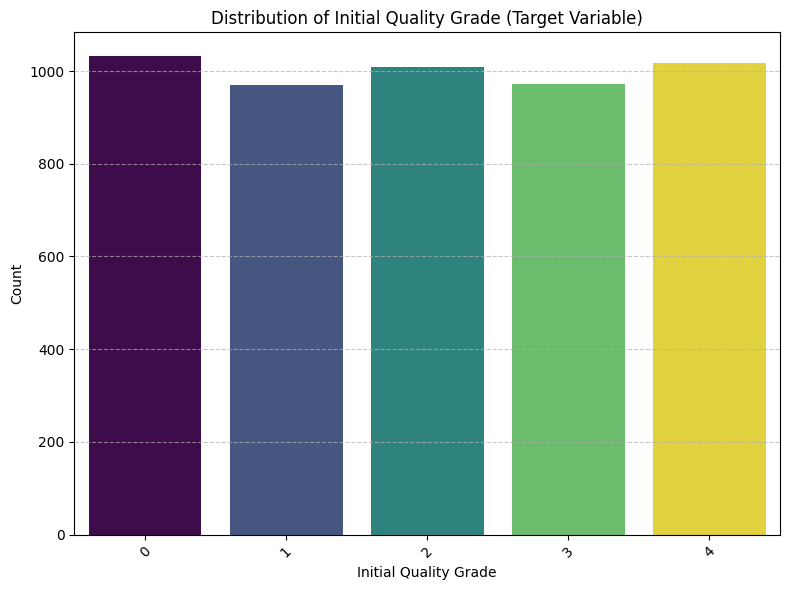


===== TARGET VARIABLE DISTRIBUTION ANALYSIS COMPLETED =====



In [54]:
##Code 19 Analysing Target variable Distribution


import matplotlib.pyplot as plt
import seaborn as sns

print("\n===== ANALYZING TARGET VARIABLE DISTRIBUTION =====\n")

# Get value counts of the target variable
rs099_y_counts = rs099_y.value_counts()

# Create a bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x=rs099_y_counts.index, y=rs099_y_counts.values, hue=rs099_y_counts.index, palette='viridis', legend=False)
plt.title('Distribution of Initial Quality Grade (Target Variable)')
plt.xlabel('Initial Quality Grade')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("\n===== TARGET VARIABLE DISTRIBUTION ANALYSIS COMPLETED =====\n")

## Review Feature Importance


Revisit the feature importance from the Decision Tree model (from Code 10) to understand which features were deemed most relevant and if any features show very low predictive power across the board.


In [25]:
##Code 20 showing feauture importance table from code 10

print("Feature Importance from Decision Tree (Code 10):")
display(rs099_feature_importance)

Feature Importance from Decision Tree (Code 10):


,Feature,Importance
4,Vehicle Type,0.170984
14,Transport Duration (hours),0.158928
28,Transportation Cost per Trip,0.137073
10,Humidity Maintained (%),0.127411
20,Daily Demand,0.123374
30,Wastage Cost,0.115200
16,Total Supply Chain Time,0.103776
29,Storage Cost,0.063254
6,No. of Vehicles Used Per Day,0.000000
8,Average Distance Travelled (km),0.000000


### Analysis of Feature Importance (Decision Tree)

The `rs099_feature_importance` DataFrame, derived from the Decision Tree model (Code 10), reveals the following insights into feature relevance for predicting 'Initial Quality Grade':

**Features with High Importance (Most Relevant):**

*   **Vehicle Type (0.170984):** This is the most significant feature, indicating that the type of vehicle used heavily influences the initial quality grade.
*   **Transport Duration (hours) (0.158928):** The duration of transportation is also a crucial factor.
*   **Transportation Cost per Trip (0.137073):** Cost associated with transportation plays a substantial role.
*   **Humidity Maintained (%) (0.127411):** The environmental conditions, specifically humidity, are very important.
*   **Daily Demand (0.123374):** Demand fluctuations appear to have a strong impact on quality.
*   **Wastage Cost (0.115200):** This cost is also highly relevant, suggesting a link to quality issues.
*   **Total Supply Chain Time (0.103776):** The overall time in the supply chain affects the quality grade.
*   **Storage Cost (0.063254):** Storage expenses also contribute to the predictive power.

These features collectively explain a significant portion of the variability in the 'Initial Quality Grade' as captured by the Decision Tree model.

**Features with Very Low or Zero Importance (Low Predictive Power):**

A large number of features have an importance score of **0.000000**. These include:

*   No. of Vehicles Used Per Day
*   Average Distance Travelled (km)
*   Vehicle Capacity (kg/ton)
*   Daily Production/Quantity
*   Transportation Method
*   Category
*   Product Name
*   Time to Loading
*   Time of Harvest
*   Packaging Method
*   Temperature Maintained (°C)
*   Trip Frequency
*   Destination Location
*   Source Location
*   Unloading Time
*   Is Real-time Tracking Used?
*   End User Type
*   Who Receives the Goods?
*   Tracking Method
*   Spoilage Percentage (%)
*   Shelf Life (Days)
*   Data Collected
*   Reasons for Spoilage

This indicates that, within this specific Decision Tree model with `max_depth=4`, these features did not contribute to any splits or decision rules. This doesn't necessarily mean they are irrelevant in general, but rather that at this model complexity and configuration, their individual predictive power was not utilized.

## Examine Feature Quality and Relationships


Briefly review the characteristics of the features (e.g., uniqueness, variance, potential for correlation among themselves and with the target) to assess their overall quality and predictive potential.


**Reasoning**:
To review the characteristics of numeric features, I will first display the previously computed measures of central tendency and dispersion, as requested in the instructions.



In [26]:
##Code 21 displaying the measure of central tendency

print("\nMeasures of Central Tendency (from Code 4):")
display(rs099_central_tendency)

print("\nMeasures of Dispersion (from Code 4):")
display(rs099_dispersion)


Measures of Central Tendency (from Code 4):


,min,max,mean,median
Daily Production/Quantity,804.0,24992.0,12859.897221,12725.0
Vehicle Capacity (kg/ton),1.0,28.0,8.056089,6.0
No. of Vehicles Used Per Day,1.0,5.0,2.999600,3.0
Trip Frequency,1.0,3.0,1.988202,2.0
Average Distance Travelled (km),40.0,700.0,364.185763,362.0
Temperature Maintained (°C),2.0,30.0,15.073985,12.0
Humidity Maintained (%),40.0,96.0,76.100980,78.0
Transport Duration (hours),1.0,18.0,9.456689,9.4
Unloading Time,0.3,3.0,1.655489,1.7
Total Supply Chain Time,3.4,26.7,14.842332,14.8



Measures of Dispersion (from Code 4):


,Range,Standard Deviation,Standard Error,Skewness,Kurtosis
Daily Production/Quantity,24188.0,7002.778205,99.024337,0.030855,-1.197309
Vehicle Capacity (kg/ton),27.0,7.031956,0.099437,1.466959,1.441228
No. of Vehicles Used Per Day,4.0,1.420141,0.020082,0.012441,-1.309670
Trip Frequency,2.0,0.819549,0.011589,0.021761,-1.510848
Average Distance Travelled (km),660.0,189.922825,2.685646,0.030111,-1.195466
Temperature Maintained (°C),28.0,8.937747,0.126386,0.026255,-1.482248
Humidity Maintained (%),56.0,14.483839,0.204812,-0.784563,-0.173966
Transport Duration (hours),17.0,4.872219,0.068897,0.011905,-1.200288
Unloading Time,2.7,0.775656,0.010968,0.000939,-1.182674
Total Supply Chain Time,23.3,5.109244,0.072248,-0.006972,-0.986506


**Reasoning**:
To further understand the relationships between numeric features, I will display the Pearson, Spearman, and Kendall correlation matrices, which were computed previously in Code 4.



In [27]:
##Code 22 Displaying the pearson, spearman, kendall correlation matrices


print("\nPearson Correlation Matrix (from Code 4):")
display(rs099_df_sample[rs099_numeric_cols].corr(method='pearson'))

print("\nSpearman Correlation Matrix (from Code 4):")
display(rs099_df_sample[rs099_numeric_cols].corr(method='spearman'))

print("\nKendall Correlation Matrix (from Code 4):")
display(rs099_df_sample[rs099_numeric_cols].corr(method='kendall'))


Pearson Correlation Matrix (from Code 4):


,Daily Production/Quantity,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),Humidity Maintained (%),Transport Duration (hours),Unloading Time,Total Supply Chain Time,Daily Demand,Shelf Life (Days),Spoilage Percentage (%),Transportation Cost per Trip,Storage Cost,Wastage Cost
Daily Production/Quantity,1.000000,0.017613,-0.002496,0.014802,-0.005219,-0.030343,0.015346,0.016639,-0.008610,0.012800,0.992830,-0.018406,0.023846,-0.002294,-0.002104,-0.014912
Vehicle Capacity (kg/ton),0.017613,1.000000,0.015664,-0.005264,-0.001079,-0.011177,0.005843,-0.007380,0.002493,-0.009397,0.019588,0.002501,-0.002894,0.015335,0.013003,-0.000423
No. of Vehicles Used Per Day,-0.002496,0.015664,1.000000,0.002745,-0.009711,0.004304,-0.008409,0.004336,-0.009094,0.005796,-0.004128,0.004178,0.012912,-0.028113,-0.032806,-0.006995
Trip Frequency,0.014802,-0.005264,0.002745,1.000000,-0.003615,-0.005997,0.009755,-0.000504,0.026168,0.004915,0.012718,-0.014015,0.007927,0.012251,-0.014532,0.008189
Average Distance Travelled (km),-0.005219,-0.001079,-0.009711,-0.003615,1.000000,-0.001616,0.018839,-0.028376,0.022947,-0.027974,-0.008390,-0.024004,-0.014278,-0.006017,-0.030700,0.007307
Temperature Maintained (°C),-0.030343,-0.011177,0.004304,-0.005997,-0.001616,1.000000,-0.534173,0.017425,0.007157,0.018616,-0.028678,0.574443,-0.343163,-0.000270,-0.026949,-0.001835
Humidity Maintained (%),0.015346,0.005843,-0.008409,0.009755,0.018839,-0.534173,1.000000,-0.028236,0.012105,-0.026079,0.011473,-0.741440,0.440714,-0.018235,0.006456,-0.014691
Transport Duration (hours),0.016639,-0.007380,0.004336,-0.000504,-0.028376,0.017425,-0.028236,1.000000,-0.000571,0.954872,0.014369,0.016374,-0.015713,0.017717,0.009527,-0.017393
Unloading Time,-0.008610,0.002493,-0.009094,0.026168,0.022947,0.007157,0.012105,-0.000571,1.000000,0.153516,-0.008362,-0.012772,0.017482,-0.016080,0.016248,0.004072
Total Supply Chain Time,0.012800,-0.009397,0.005796,0.004915,-0.027974,0.018616,-0.026079,0.954872,0.153516,1.000000,0.010066,0.012164,-0.012367,0.013138,0.019857,-0.016203



Spearman Correlation Matrix (from Code 4):


,Daily Production/Quantity,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),Humidity Maintained (%),Transport Duration (hours),Unloading Time,Total Supply Chain Time,Daily Demand,Shelf Life (Days),Spoilage Percentage (%),Transportation Cost per Trip,Storage Cost,Wastage Cost
Daily Production/Quantity,1.000000,0.026012,-0.002678,0.014882,-0.004964,-0.031768,0.011888,0.016799,-0.008541,0.012438,0.993677,-0.010885,0.023856,-0.002006,-0.001588,-0.014675
Vehicle Capacity (kg/ton),0.026012,1.000000,0.018821,-0.001480,-0.003566,-0.008580,-0.005904,-0.011239,0.007760,-0.009603,0.026447,-0.002969,-0.009178,0.020684,0.008459,0.002116
No. of Vehicles Used Per Day,-0.002678,0.018821,1.000000,0.002697,-0.009977,0.006392,-0.010402,0.004471,-0.009007,0.006351,-0.003550,0.000250,0.014497,-0.027950,-0.033027,-0.007017
Trip Frequency,0.014882,-0.001480,0.002697,1.000000,-0.003702,-0.007316,0.008123,-0.000257,0.025903,0.004845,0.012981,-0.014119,0.015113,0.012129,-0.014948,0.008654
Average Distance Travelled (km),-0.004964,-0.003566,-0.009977,-0.003702,1.000000,-0.001564,0.013808,-0.028397,0.022288,-0.029791,-0.008073,-0.009061,-0.007103,-0.005872,-0.031103,0.007135
Temperature Maintained (°C),-0.031768,-0.008580,0.006392,-0.007316,-0.001564,1.000000,-0.475461,0.015398,0.006970,0.016913,-0.029967,0.479554,-0.421113,0.000578,-0.025609,-0.002600
Humidity Maintained (%),0.011888,-0.005904,-0.010402,0.008123,0.013808,-0.475461,1.000000,-0.028668,0.010054,-0.025827,0.007881,-0.551963,0.493176,-0.013735,0.012953,-0.013954
Transport Duration (hours),0.016799,-0.011239,0.004471,-0.000257,-0.028397,0.015398,-0.028668,1.000000,-0.000524,0.958108,0.015122,0.008042,-0.022050,0.017778,0.008964,-0.017545
Unloading Time,-0.008541,0.007760,-0.009007,0.025903,0.022288,0.006970,0.010054,-0.000524,1.000000,0.143979,-0.008789,-0.015798,0.012405,-0.016049,0.016794,0.003567
Total Supply Chain Time,0.012438,-0.009603,0.006351,0.004845,-0.029791,0.016913,-0.025827,0.958108,0.143979,1.000000,0.010266,0.007904,-0.019090,0.013796,0.018818,-0.016035



Kendall Correlation Matrix (from Code 4):


,Daily Production/Quantity,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),Humidity Maintained (%),Transport Duration (hours),Unloading Time,Total Supply Chain Time,Daily Demand,Shelf Life (Days),Spoilage Percentage (%),Transportation Cost per Trip,Storage Cost,Wastage Cost
Daily Production/Quantity,1.000000,0.018024,-0.001960,0.011472,-0.003432,-0.021998,0.008052,0.011336,-0.005872,0.008433,0.933175,-0.007345,0.016219,-0.001349,-0.001155,-0.009777
Vehicle Capacity (kg/ton),0.018024,1.000000,0.014328,-0.001160,-0.002554,-0.006145,-0.004102,-0.007748,0.005375,-0.006673,0.018366,-0.002033,-0.006449,0.014272,0.005853,0.001493
No. of Vehicles Used Per Day,-0.001960,0.014328,1.000000,0.002290,-0.007320,0.004818,-0.007648,0.003202,-0.006768,0.004602,-0.002592,0.000133,0.010671,-0.020399,-0.024209,-0.005157
Trip Frequency,0.011472,-0.001160,0.002290,1.000000,-0.002853,-0.005878,0.006299,-0.000216,0.020309,0.003699,0.009998,-0.011119,0.011852,0.009346,-0.011559,0.006737
Average Distance Travelled (km),-0.003432,-0.002554,-0.007320,-0.002853,1.000000,-0.001059,0.009289,-0.018647,0.014985,-0.019513,-0.005451,-0.006244,-0.004847,-0.003964,-0.020877,0.004757
Temperature Maintained (°C),-0.021998,-0.006145,0.004818,-0.005878,-0.001059,1.000000,-0.333058,0.010703,0.004993,0.011839,-0.020745,0.336244,-0.294832,0.000253,-0.017645,-0.001799
Humidity Maintained (%),0.008052,-0.004102,-0.007648,0.006299,0.009289,-0.333058,1.000000,-0.019383,0.006867,-0.017494,0.005259,-0.376014,0.335045,-0.009208,0.008843,-0.009406
Transport Duration (hours),0.011336,-0.007748,0.003202,-0.000216,-0.018647,0.010703,-0.019383,1.000000,-0.000475,0.815449,0.010239,0.005208,-0.014742,0.011879,0.006064,-0.011738
Unloading Time,-0.005872,0.005375,-0.006768,0.020309,0.014985,0.004993,0.006867,-0.000475,1.000000,0.098091,-0.006056,-0.010884,0.008314,-0.010875,0.011490,0.002536
Total Supply Chain Time,0.008433,-0.006673,0.004602,0.003699,-0.019513,0.011839,-0.017494,0.815449,0.098091,1.000000,0.006950,0.005178,-0.012789,0.009194,0.012501,-0.010483


### Analysis of Categorical Variables (from Code 4)

Reviewing the categorical variable analysis from Code 4, we observe the distribution and cardinalities of each:

*   **Product Name**: Has many unique values with varying frequencies (e.g., 'Coriander Leaves' highest, 'Onion' lowest). This suggests a high cardinality and potential for diverse categories.
*   **Category**: Shows a few dominant categories (e.g., 'Vegetable' highest) and some less frequent ones (e.g., 'Grain/Oilseed' lowest). The distribution might be somewhat skewed.
*   **Transportation Method**: Highly skewed, with 'By Road' being overwhelmingly dominant. This indicates a very low variance in transportation method.
*   **Vehicle Type**: Also shows a skewed distribution, with 'Insulated Truck' being the most frequent and 'Refrigerated Truck' the least. This feature also has a moderate number of unique values.
*   **Packaging Method**: Skewed towards 'Loose in Bins' as the highest category, with 'Gunny Bags' being the lowest.
*   **Time of Harvest** and **Time to Loading**: These are likely time-of-day categories, exhibiting various frequencies across different time points. They can have moderate cardinality.
*   **Source Location** and **Destination Location**: These are geographic locations, and the counts suggest many unique locations, potentially leading to high cardinality.
*   **Who Receives the Goods?** and **End User Type**: These have a few distinct categories with varying frequencies.
*   **Is Real-time Tracking Used?**: Binary, with 'Yes' being the dominant category.
*   **Tracking Method**: This variable had a significant number of missing values (as noted in the initial data description), and its distribution suggests 'GPS + IoT' is the most frequent among the non-missing values.
*   **Data Collected**: Several distinct categories indicating what type of data is collected.
*   **Initial Quality Grade**: This is our target variable, showing a relatively balanced distribution across its categories (e.g., 'A' highest, 'A-' lowest). This suggests that class imbalance in the target variable might not be a primary issue, though the counts are not perfectly uniform.
*   **Reasons for Spoilage**: Multiple reasons for spoilage with 'Dehydration' being the most frequent and 'Over-ripening' the least.

### Missing Values and Cardinality in Original Data

*   **Missing Values in 'Tracking Method'**: The initial data description (and `df.info()` from Code 1) indicated that 'Tracking Method' had 50,125 non-null entries out of 100,000 observations, suggesting a significant number of missing values (approximately 50%). During preprocessing (Code 3), all categorical variables, including 'Tracking Method', were imputed using the mode. This means that any missing values in 'Tracking Method' were filled with the most frequent category in that column.

*   **Cardinality of Object-type Columns (before encoding)**:
    *   The `df.info()` output in Code 1 for the original `df` confirmed 16 object-type columns. Examining these columns' unique values before encoding (as implied by the categorical variable analysis in Code 4 and the descriptive summary `summary_df`):
        *   Features like `Product Name`, `Source Location`, and `Destination Location` likely have high cardinality, meaning many unique values. This was evident in the 'Categorical Variable Analysis' where `value_counts()` showed numerous distinct entries.
        *   `Category`, `Transportation Method`, `Vehicle Type`, `Packaging Method`, `Who Receives the Goods?`, `End User Type`, `Is Real-time Tracking Used?`, `Tracking Method`, `Data Collected`, `Initial Quality Grade`, and `Reasons for Spoilage` have lower to moderate cardinality, generally with a manageable number of unique categories. `Initial Quality Grade` had 5 unique values, and `Is Real-time Tracking Used?` had 2, for example.
    *   High cardinality features, while potentially rich in information, can pose challenges for certain models and often require specific handling (e.g., more advanced encoding techniques, feature hashing, or grouping rare categories) to prevent overfitting or dimensionality issues. In this case, `LabelEncoder` was applied which assigns a numerical label to each unique category, and `OneHotEncoder` was later used (implicitly by `pd.get_dummies`) for nominal features, which can significantly increase dimensionality for high cardinality features.

## Consider Data Preprocessing Enhancements

Suggest potential enhancements to the data preprocessing steps, such as more sophisticated encoding methods, outlier handling, or feature transformation techniques, that could create more informative features.

### Current Preprocessing Overview (from Code 3 and Analysis):
*   **Missing Values:** Columns with >=50% missing were removed. Remaining categorical missing values were imputed with the mode, and numeric missing values with the median.
*   **Encoding:** All categorical variables were first Label Encoded, then One-Hot Encoded. `rs099_df_clean` was label encoded, and `rs099_df_encoded` was one-hot encoded.
*   **Scaling/Transformation:** `StandardScaler`, `MinMaxScaler`, and `Log Transformation` were applied, generating `rs099_scaled_data`, `rs099_normalized_data`, and `rs099_df_log` respectively, but specific usage in models was not always explicit (e.g., `KNeighborsClassifier` used `rs099_X_train_scaled`).
*   **Target Variable:** 'Initial Quality Grade' is a multi-class categorical variable.
*   **Feature Importance (Code 10):** Identified 'Vehicle Type', 'Transport Duration (hours)', 'Transportation Cost per Trip', 'Humidity Maintained (%)', 'Daily Demand', 'Wastage Cost', 'Total Supply Chain Time', and 'Storage Cost' as key features, while many others had zero importance in the limited-depth Decision Tree.
*   **Correlations (Code 4):** Indicated some strong correlations among numeric features.
*   **Normality (Code 6):** Most numeric features showed non-normal distributions (highly skewed).

### Potential Enhancements to Data Preprocessing:

1.  **Alternative Encoding Strategies for High-Cardinality Categorical Features:**
    *   **High-Cardinality Features:** 'Product Name', 'Source Location', 'Destination Location', 'Tracking Method', 'Data Collected', and 'Reasons for Spoilage' are likely high-cardinality features. Currently, all categorical features are first label-encoded, then one-hot encoded. One-Hot Encoding these features can lead to a very large number of new columns, increasing dimensionality and potentially overfitting.
    *   **Enhancements:**
        *   **Target Encoding (Mean Encoding):** Replace each category with the mean of the target variable for that category. This can be very effective but is prone to overfitting and requires careful validation (e.g., K-fold target encoding).
        *   **Feature Hashing:** Maps categories to a fixed-size vector. This avoids increasing dimensionality significantly and works well for very high cardinality but loses interpretability.
        *   **Grouping Rare Categories:** Group categories that appear infrequently into an 'Other' category. This reduces the number of unique categories before One-Hot Encoding, managing dimensionality.
        *   **Weight of Evidence (WOE) / Information Value (IV):** Particularly useful in binary classification, these methods measure the predictive power of a categorical feature and can be adapted for multi-class by treating it as multiple binary problems. They replace categories with numerical values based on their relationship with the target variable.

2.  **Handling Multicollinearity in Numeric Features:**
    *   **Observed Multicollinearity:** The correlation matrices (Code 4) already showed strong relationships between some numeric features. For instance, 'Daily Production/Quantity' and 'Daily Demand' might be highly correlated, and 'Transport Duration (hours)' is very likely correlated with 'Total Supply Chain Time'. High multicollinearity can make model interpretation difficult and lead to unstable model coefficients.
    *   **Enhancements:**
        *   **Principal Component Analysis (PCA):** A dimensionality reduction technique that transforms features into a smaller set of uncorrelated components while retaining most of the variance. This can effectively handle multicollinearity.
        *   **Variance Inflation Factor (VIF) Analysis:** Calculate VIF scores for features. Features with high VIF (e.g., >5 or >10) indicate significant multicollinearity. One can then iteratively remove features with the highest VIF until multicollinearity is reduced.
        *   **Feature Selection:** If two features are highly correlated, consider keeping only one of them, especially if one is more interpretable or less noisy. For example, keeping 'Total Supply Chain Time' might be more holistic than 'Transport Duration (hours)' alone if both convey similar information.

3.  **Handling Skewed Numeric Distributions:**
    *   **Observed Skewness:** The tests of normality (Code 6) indicated that most numeric features are not normally distributed, suggesting skewness. Skewed data can negatively impact the performance of models that assume normality or linearity.
    *   **Enhancements:**
        *   **Log Transformation:** Already applied in Code 3 (for positive values) but not explicitly used in all models. Re-evaluate its impact and consistently use it where appropriate.
        *   **Box-Cox Transformation:** A more general power transformation that can handle various types of skewness. It requires features to be strictly positive.
        *   **Yeo-Johnson Transformation:** Similar to Box-Cox but can handle zero and negative values.
        *   **Square Root Transformation:** Another common power transformation, suitable for moderately skewed positive data.

4.  **Outlier Detection and Treatment:**
    *   **Observed Outliers:** Box plots (Code 5) visually confirmed the presence of outliers in several numeric features. Outliers can unduly influence model training, especially for distance-based algorithms like KNN or models sensitive to feature scales.
    *   **Enhancements:**
        *   **IQR Method:** Use the Interquartile Range to define fences (e.g., Q1 - 1.5*IQR, Q3 + 1.5*IQR) and either remove outliers, cap them (Winsorization), or replace them with the median/mean.
        *   **Z-score Method:** For approximately normally distributed data, values beyond a certain standard deviation (e.g., |Z-score| > 3) can be considered outliers. Similar treatment options (remove, cap, replace) apply.
        *   **Model-Based Methods:** Utilize algorithms like Isolation Forest or One-Class SVM to detect outliers, especially in high-dimensional data.

5.  **Re-evaluating Imputation for 'Tracking Method':**
    *   **Current Imputation:** 'Tracking Method' had ~50% missing values and was imputed with the mode (Code 3). While simple, this might introduce bias, especially if the missingness itself is not random.
    *   **Enhancements:**
        *   **Consider Dropping:** Given 50% missing data, explicitly consider if the feature should be dropped entirely, as its predictive power might be limited or the imputed values might dilute its true signal.
        *   **'Missing' as a Category:** If the missingness is potentially informative, treat 'NaN' as its own category before encoding.
        *   **Predictive Imputation:** For categorical data, using a classifier (e.g., Decision Tree or KNN) to predict missing values based on other features could be more sophisticated than mode imputation. This is more complex and adds computational overhead.

6.  **Feature Engineering for More Informative Features:**
    *   **Current Features:** 'Time of Harvest' and 'Time to Loading' are categorical (object type, then encoded). Their individual importance was zero in the Decision Tree, suggesting the current representation isn't effective.
    *   **Enhancements:**
        *   **Time-Based Features:** If 'Time of Harvest' and 'Time to Loading' represent actual timestamps, extract features like hour of day, day of week, or a binary flag for 'peak hours'/'off-peak hours'.
        *   **Durations/Intervals:** Calculate `Loading Duration = Time to Loading - Time of Harvest`. This new feature could capture critical operational delays.
        *   **Ratios:** Create ratios that might be more informative. For example:
            *   `Wastage_Rate = Wastage Cost / Daily Production/Quantity`
            *   `Cost_Efficiency = Total Supply Chain Time / (Transportation Cost per Trip + Storage Cost)`
            *   `Spoilage_per_ShelfLife = Spoilage Percentage (%) / Shelf Life (Days)`
        *   **Interaction Terms:** Create interaction features between important variables. For instance, `Humidity_Temp_Interaction = Humidity Maintained (%) * Temperature Maintained (°C)`.

### The Importance of Hyperparameter Tuning

The current low accuracy and F1-scores (ranging from approximately 0.19 to 0.20) across all evaluated models (Logistic Regression, SVM, SGD Classifier, Decision Tree, Random Forest, and XGBoost) highlight that these models are likely not optimally configured for the given classification task. This underperformance suggests that the default hyperparameters used might not be suitable for this specific dataset and problem.

Hyperparameter tuning is crucial because:

*   **Optimizing Performance:** Models have internal parameters (hyperparameters) that are not learned from the data during training but are set prior to training. These include parameters like `C` for SVM, `n_neighbors` for KNN, `max_depth` for Decision Trees and Random Forests, `learning_rate` for XGBoost, etc. The choice of these hyperparameters significantly impacts a model's ability to learn from the data and generalize to unseen data.
*   **Addressing Model Limitations:** Each algorithm has strengths and weaknesses. Proper tuning can help mitigate some weaknesses or enhance strengths. For instance, a too-shallow Decision Tree might underfit, while a too-deep one might overfit; tuning `max_depth` can find the right balance.
*   **Finding the "Sweet Spot":** There isn't a one-size-fits-all set of hyperparameters. The optimal configuration is highly dependent on the dataset's characteristics. Tuning helps discover the combination that yields the best performance metrics for a specific problem.
*   **Avoiding Underfitting/Overfitting:** Incorrect hyperparameters can lead to models that either fail to capture the underlying patterns in the data (underfitting) or learn noise from the training data too well, performing poorly on new data (overfitting). Tuning helps strike a balance.

### Proposed Hyperparameters for Tuning for Each Model

To improve the performance of the models, specific hyperparameters should be tuned for each algorithm:

1.  **Logistic Regression (`LogisticRegression`):**
    *   `C`: Inverse of regularization strength. Smaller values specify stronger regularization. This helps prevent overfitting.
    *   `solver`: Algorithm to use in the optimization problem. Choices include `'liblinear'`, `'lbfgs'`, `'newton-cg'`, `'sag'`, `'saga'`. The best solver depends on the dataset size and whether L1 or L2 regularization is used.
    *   `penalty`: The norm used in the penalization. Options are `'l1'`, `'l2'`, `'elasticnet'`, `'none'`. Combats overfitting.

2.  **Support Vector Machine (`SVC`):**
    *   `C`: Regularization parameter. A smaller `C` emphasizes a wider margin, allowing for more misclassifications, while a larger `C` aims for correct classification of all training examples, potentially leading to overfitting.
    *   `kernel`: Specifies the kernel type to be used in the algorithm. Options include `'linear'`, `'poly'`, `'rbf'`, `'sigmoid'`. The choice of kernel significantly affects the decision boundary.
    *   `gamma`: Kernel coefficient for `'rbf'`, `'poly'` and `'sigmoid'`. Controls the influence of individual training samples. A small `gamma` means a large radius of influence, and a large `gamma` means a small radius of influence.
    *   `degree`: Degree of the polynomial kernel function (only relevant for `'poly'` kernel).

3.  **Stochastic Gradient Descent Classifier (`SGDClassifier`):**
    *   `loss`: The loss function to be used. Common choices are `'hinge'` (linear SVM), `'log_loss'` (logistic regression), `'modified_huber'` (robust classification).
    *   `penalty`: The penalty (regularization) to be used. Options are `'l1'`, `'l2'`, `'elasticnet'`. Combats overfitting.
    *   `alpha`: Constant that multiplies the regularization term. Higher values imply stronger regularization.
    *   `max_iter`: The maximum number of passes over the training data (epochs).
    *   `learning_rate`: The learning rate schedule. Can be `'constant'`, `'optimal'`, `'invscaling'`, `'adaptive'`.
    *   `eta0`: The initial learning rate for the `'constant'`, `'invscaling'`, or `'adaptive'` schedules.

4.  **Decision Tree Classifier (`DecisionTreeClassifier`):**
    *   `max_depth`: The maximum depth of the tree. Controls overfitting by limiting how deeply the tree can grow.
    *   `min_samples_split`: The minimum number of samples required to split an internal node. Higher values prevent the model from learning highly specific relations.
    *   `min_samples_leaf`: The minimum number of samples required to be at a leaf node. Similar to `min_samples_split`, it helps to smooth the model.
    *   `criterion`: The function to measure the quality of a split. Options are `'gini'` for Gini impurity and `'entropy'` for information gain.

5.  **K-Nearest Neighbors (`KNeighborsClassifier`):**
    *   `n_neighbors`: The number of neighbors to consider. The optimal number can significantly affect model performance.
    *   `weights`: Weight function used in prediction. Options are `'uniform'` (all points in neighborhood are weighted equally) and `'distance'` (weight points by the inverse of their distance).
    *   `p`: Power parameter for the Minkowski metric. `p=1` corresponds to Manhattan distance, and `p=2` to Euclidean distance.

6.  **Random Forest Classifier (`RandomForestClassifier`):**
    *   `n_estimators`: The number of trees in the forest. More trees generally lead to better performance but increase computational cost.
    *   `max_depth`: Similar to Decision Tree, controls the maximum depth of individual trees.
    *   `min_samples_split`: Minimum number of samples required to split an internal node.
    *   `min_samples_leaf`: Minimum number of samples required to be at a leaf node.
    *   `max_features`: The number of features to consider when looking for the best split. Options include `'sqrt'` (square root of total features) or `'log2'`.
    *   `criterion`: The function to measure the quality of a split, `'gini'` or `'entropy'`.

7.  **XGBoost Classifier (`XGBClassifier`):**
    *   `n_estimators`: Number of boosting rounds (trees).
    *   `learning_rate`: Step size shrinkage used in updates to prevent overfitting. Smaller values make the model more robust to overfitting.
    *   `max_depth`: Maximum depth of a tree. Used to control overfitting.
    *   `subsample`: Subsample ratio of the training instance. Helps prevent overfitting.
    *   `colsample_bytree`: Subsample ratio of columns when constructing each tree.
    *   `gamma`: Minimum loss reduction required to make a further partition on a leaf node of the tree. Larger `gamma` makes the model more conservative.
    *   `reg_alpha` (L1 regularization) and `reg_lambda` (L2 regularization): Regularization terms to prevent overfitting.

### Methods for Hyperparameter Tuning

Once the relevant hyperparameters for each model are identified, systematic approaches are needed to explore the parameter space and find the optimal combination. The two most common and effective methods are:

1.  **GridSearchCV (`sklearn.model_selection.GridSearchCV`):**
    *   **How it works:** GridSearchCV exhaustively searches over a specified subset of hyperparameters for an estimator. For each combination of hyperparameters, it fits the model on the training data and evaluates its performance using cross-validation. The combination that yields the best average performance across all cross-validation folds is selected as the optimal set.
    *   **Pros:** Guarantees finding the best combination within the defined search space.
    *   **Cons:** Can be computationally very expensive and time-consuming, especially when dealing with many hyperparameters or a wide range of possible values, as it evaluates every single combination.

2.  **RandomizedSearchCV (`sklearn.model_selection.RandomizedSearchCV`):**
    *   **How it works:** Instead of trying every possible combination, RandomizedSearchCV samples a fixed number of parameter settings from specified distributions. This allows for a more efficient search in large parameter spaces. It also performs cross-validation for each sampled combination.
    *   **Pros:** Significantly faster than GridSearchCV, especially for high-dimensional search spaces, while often yielding nearly as good results. It has been shown to be more efficient in finding good parameter combinations when the number of iterations is large enough.
    *   **Cons:** Does not guarantee finding the absolute best combination within the search space, as it doesn't explore all possibilities.

**Best Practices for Tuning:**

*   **Define a sensible search space:** Start with a broad range for hyperparameters and narrow it down in iterative steps.
*   **Use cross-validation:** Both methods inherently use cross-validation to prevent overfitting to the validation set and provide a more robust estimate of model performance.
*   **Monitor computational resources:** Tuning can be resource-intensive. Consider using fewer folds for cross-validation or reducing the search space if computational limits are hit.
*   **Start with Randomized Search:** For large search spaces, it's often practical to start with RandomizedSearchCV to quickly narrow down promising regions, and then use GridSearchCV for a finer-grained search in those regions.

### The Role and Benefits of Cross-Validation

Cross-validation is a critical technique for robust model evaluation and hyperparameter selection. It addresses several limitations of a simple train-test split, providing a more reliable estimate of a model's performance on unseen data and helping to prevent overfitting.

**Why Cross-Validation is Essential:**

1.  **More Reliable Performance Estimation:** A single train-test split can be highly dependent on the particular samples chosen for the training and test sets. Cross-validation involves multiple splits and averages the results, providing a more stable and less biased estimate of a model's true performance.
2.  **Efficient Use of Data:** In situations where data is limited, cross-validation allows all data points to be used for both training and validation across different folds, maximizing the utility of the available dataset.
3.  **Detecting Overfitting:** By evaluating the model on multiple test sets, cross-validation can expose models that perform well on the training data but poorly on unseen data, indicating overfitting.
4.  **Robust Hyperparameter Selection:** When combined with tuning methods like GridSearchCV or RandomizedSearchCV, cross-validation ensures that the chosen hyperparameters are robust and generalize well, as they are selected based on performance across multiple validation sets.

**Types of Cross-Validation and Their Benefits:**

*   **K-Fold Cross-Validation:**
    *   **How it works:** The dataset is divided into `k` equal-sized folds. In each iteration, one fold is used as the validation set, and the remaining `k-1` folds are used as the training set. This process is repeated `k` times, ensuring each fold serves as a validation set exactly once.
    *   **Benefit:** Provides a good balance between bias and variance in performance estimation. It's widely applicable and provides a more generalizable performance metric than a single split.

*   **Stratified K-Fold Cross-Validation:**
    *   **How it works:** This is a variation of K-Fold where the folds are created such that the proportion of each target class is approximately the same in each fold as it is in the complete dataset. This is particularly important for multi-class classification problems like 'Initial Quality Grade'.
    *   **Benefit:** Crucial for **imbalanced datasets**. If class distributions are uneven (though `Initial Quality Grade` appears relatively balanced, it's good practice), Stratified K-Fold ensures that each fold is representative of the overall class distribution, preventing scenarios where a fold might contain very few or no samples of a minority class. This leads to more reliable and less optimistic performance estimates for all classes.

**Impact on Model Performance and Robustness:**

Implementing cross-validation, especially stratified K-Fold for our multi-class problem, will ensure that:

*   **Model evaluation is more reliable:** The accuracy and F1-scores will be a more accurate reflection of how the model will perform on new, unseen data.
*   **Hyperparameter tuning is more effective:** Optimal hyperparameters will be selected based on their ability to generalize across different data subsets, not just one specific split.
*   **Findings are more robust:** The insights gained from comparing different models and their optimized configurations will be more trustworthy, leading to better decision-making for deployment.

By systematically applying hyperparameter tuning with robust cross-validation strategies, we aim to significantly improve the predictive accuracy and generalization capability of our supervised machine learning models, moving beyond the currently observed low performance figures.


 Performing K-Fold Cross-Validation for the remaining models (Logistic Regression, Support Vector Machine, SGD Classifier, Random Forest, and XGBoost) and update the performance summary with these results.

First, I will define a helper function to perform stratified k-fold cross-validation with a StandardScaler pipeline for each model, as direct scaling of `rs099_X` before cross-validation would cause data leakage. I will then apply this function to each model and collect the mean cross-validation accuracy.

**Performing Cross Validation**

## Perform K-Fold Cross-Validation for Logistic Regression


Apply Stratified K-Fold Cross-Validation (5 folds) to the Logistic Regression model using `rs099_X` (scaled) and `rs099_y`. Report the cross-validation scores and their mean.


In [30]:
##Code 23 K fold for LR

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score

print("\n===== PERFORMING K-FOLD CROSS-VALIDATION FOR LOGISTIC REGRESSION =====\n")

# Re-define rs099_X and rs099_y here for scope, as they were defined in a previous cell.
# Assuming rs099_df_clean and rs099_target are available from prior executions.
# If not, they would need to be re-created or passed as arguments.
# Based on previous code (EIVlBgL2E7QY):
rs099_target = 'Initial Quality Grade'
rs099_X = rs099_df_clean.drop(columns=[rs099_target])
rs099_y = rs099_df_clean[rs099_target]

def perform_stratified_kfold_cv(model, X, y, n_splits=5):
    # Create StratifiedKFold object
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=99)

    # Create an sklearn.pipeline.Pipeline that first scales and then fits the model
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('model', model)
    ])

    # Use cross_val_score with the pipeline
    cv_scores = cross_val_score(pipeline, X, y, cv=skf, scoring='accuracy')
    return cv_scores

# Instantiate a LogisticRegression model
rs099_lr_model_cv = LogisticRegression(random_state=99, solver='liblinear', multi_class='ovr')

# Perform Stratified K-Fold Cross-Validation
lr_cv_scores = perform_stratified_kfold_cv(rs099_lr_model_cv, rs099_X, rs099_y, n_splits=5)

# Print the obtained cross-validation scores
print("Logistic Regression CV Accuracy Scores:")
print(lr_cv_scores)

# Print the mean of these cross-validation scores
print(f"Mean Logistic Regression CV Accuracy: {lr_cv_scores.mean():.4f}")

print("\n===== K-FOLD CROSS-VALIDATION FOR LOGISTIC REGRESSION COMPLETED =====\n")


===== PERFORMING K-FOLD CROSS-VALIDATION FOR LOGISTIC REGRESSION =====



/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Logistic Regression CV Accuracy Scores:
[0.20979021 0.211      0.198      0.181      0.207     ]
Mean Logistic Regression CV Accuracy: 0.2014

===== K-FOLD CROSS-VALIDATION FOR LOGISTIC REGRESSION COMPLETED =====



/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


## Perform K-Fold Cross-Validation for Support Vector Machine

Apply Stratified K-Fold Cross-Validation (5 folds) to the Support Vector Machine (SVM) model using `rs099_X` (scaled implicitly by the pipeline) and `rs099_y`. Report the cross-validation scores and their mean.


**Reasoning**:
The subtask requires performing Stratified K-Fold Cross-Validation for the SVM model. I will use the previously defined `perform_stratified_kfold_cv` helper function and instantiate an `SVC` model to perform the cross-validation and report the results.



In [45]:
##Code 24 K-fold for SVM

from sklearn.svm import SVC

print("\n===== PERFORMING K-FOLD CROSS-VALIDATION FOR SUPPORT VECTOR MACHINE =====\n")

# Instantiate an SVC model
# kernel='linear' is used for consistency with previous SVM fitting (7e417576).
rs099_svm_model_cv = SVC(random_state=99, kernel='linear')

# Perform Stratified K-Fold Cross-Validation
svm_cv_scores = perform_stratified_kfold_cv(rs099_svm_model_cv, rs099_X, rs099_y, n_splits=5)

# Print the obtained cross-validation scores
print("Support Vector Machine CV Accuracy Scores:")
print(svm_cv_scores)

# Print the mean of these cross-validation scores
print(f"Mean Support Vector Machine CV Accuracy: {svm_cv_scores.mean():.4f}")

print("\n===== K-FOLD CROSS-VALIDATION FOR SUPPORT VECTOR MACHINE COMPLETED =====\n")


===== PERFORMING K-FOLD CROSS-VALIDATION FOR SUPPORT VECTOR MACHINE =====

Support Vector Machine CV Accuracy Scores:
[0.2007992 0.202     0.193     0.182     0.221    ]
Mean Support Vector Machine CV Accuracy: 0.1998

===== K-FOLD CROSS-VALIDATION FOR SUPPORT VECTOR MACHINE COMPLETED =====



## Perform K-Fold Cross-Validation for Stochastic Gradient Descent (SGD) Classifier


Apply Stratified K-Fold Cross-Validation (5 folds) to the Stochastic Gradient Descent (SGD) Classifier model using `rs099_X` (scaled implicitly by the pipeline) and `rs099_y`. Report the cross-validation scores and their mean.

In [46]:
##Code 25 K-fold for SDG


from sklearn.linear_model import SGDClassifier

print("\n===== PERFORMING K-FOLD CROSS-VALIDATION FOR STOCHASTIC GRADIENT DESCENT (SGD) CLASSIFIER =====\n")

# Instantiate an SGDClassifier model
# Parameters are kept consistent with previous SGD fitting (ef822afb)
rs099_sgd_model_cv = SGDClassifier(random_state=99, loss='log_loss', max_iter=1000, eta0=0.01)

# Perform Stratified K-Fold Cross-Validation
sgd_cv_scores = perform_stratified_kfold_cv(rs099_sgd_model_cv, rs099_X, rs099_y, n_splits=5)

# Print the obtained cross-validation scores
print("SGD Classifier CV Accuracy Scores:")
print(sgd_cv_scores)

# Print the mean of these cross-validation scores
print(f"Mean SGD Classifier CV Accuracy: {sgd_cv_scores.mean():.4f}")

print("\n===== K-FOLD CROSS-VALIDATION FOR STOCHASTIC GRADIENT DESCENT (SGD) CLASSIFIER COMPLETED =====\n")


===== PERFORMING K-FOLD CROSS-VALIDATION FOR STOCHASTIC GRADIENT DESCENT (SGD) CLASSIFIER =====

SGD Classifier CV Accuracy Scores:
[0.18681319 0.208      0.19       0.175      0.222     ]
Mean SGD Classifier CV Accuracy: 0.1964

===== K-FOLD CROSS-VALIDATION FOR STOCHASTIC GRADIENT DESCENT (SGD) CLASSIFIER COMPLETED =====



## Perform K-Fold Cross-Validation for Random Forest Classifier

Apply Stratified K-Fold Cross-Validation (5 folds) to the Random Forest Classifier model using `rs099_X` (scaled implicitly by the pipeline) and `rs099_y`. Report the cross-validation scores and their mean.

In [47]:
##Code 26 K-fold for RF

from sklearn.ensemble import RandomForestClassifier

print("\n===== PERFORMING K-FOLD CROSS-VALIDATION FOR RANDOM FOREST CLASSIFIER =====\n")

# Instantiate a RandomForestClassifier model
# Parameters are kept consistent with previous RF fitting (afd855ea)
rs099_rf_model_cv = RandomForestClassifier(random_state=99, n_estimators=100)

# Perform Stratified K-Fold Cross-Validation
rf_cv_scores = perform_stratified_kfold_cv(rs099_rf_model_cv, rs099_X, rs099_y, n_splits=5)

# Print the obtained cross-validation scores
print("Random Forest Classifier CV Accuracy Scores:")
print(rf_cv_scores)

# Print the mean of these cross-validation scores
print(f"Mean Random Forest Classifier CV Accuracy: {rf_cv_scores.mean():.4f}")

print("\n===== K-FOLD CROSS-VALIDATION FOR RANDOM FOREST CLASSIFIER COMPLETED =====\n")


===== PERFORMING K-FOLD CROSS-VALIDATION FOR RANDOM FOREST CLASSIFIER =====

Random Forest Classifier CV Accuracy Scores:
[0.1988012 0.206     0.204     0.188     0.189    ]
Mean Random Forest Classifier CV Accuracy: 0.1972

===== K-FOLD CROSS-VALIDATION FOR RANDOM FOREST CLASSIFIER COMPLETED =====



## Perform K-Fold Cross-Validation for Extreme Gradient Boosting (XGBoost) Classifier


Apply Stratified K-Fold Cross-Validation (5 folds) to the Extreme Gradient Boosting (XGBoost) Classifier model using `rs099_X` (scaled implicitly by the pipeline) and `rs099_y`. Report the cross-validation scores and their mean.

In [48]:
##27 K-Fold for XGB


import xgboost as xgb

print("\n===== PERFORMING K-FOLD CROSS-VALIDATION FOR EXTREME GRADIENT BOOSTING (XGBOOST) CLASSIFIER =====\n")

# Instantiate an XGBClassifier model
# Parameters are kept consistent with previous XGBoost fitting (86f6956b)
rs099_xgb_model_cv = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=len(rs099_y.unique()),
    random_state=99,
    eval_metric='mlogloss'
)

# Perform Stratified K-Fold Cross-Validation
xgb_cv_scores = perform_stratified_kfold_cv(rs099_xgb_model_cv, rs099_X, rs099_y, n_splits=5)

# Print the obtained cross-validation scores
print("XGBoost Classifier CV Accuracy Scores:")
print(xgb_cv_scores)

# Print the mean of these cross-validation scores
print(f"Mean XGBoost Classifier CV Accuracy: {xgb_cv_scores.mean():.4f}")

print("\n===== K-FOLD CROSS-VALIDATION FOR EXTREME GRADIENT BOOSTING (XGBOOST) CLASSIFIER COMPLETED =====\n")


===== PERFORMING K-FOLD CROSS-VALIDATION FOR EXTREME GRADIENT BOOSTING (XGBOOST) CLASSIFIER =====

XGBoost Classifier CV Accuracy Scores:
[0.21378621 0.216      0.208      0.198      0.209     ]
Mean XGBoost Classifier CV Accuracy: 0.2090

===== K-FOLD CROSS-VALIDATION FOR EXTREME GRADIENT BOOSTING (XGBOOST) CLASSIFIER COMPLETED =====



**Reasoning**:
All specified models have now undergone K-Fold Cross-Validation. The next step is to update the `performance_summary` DataFrame with these new cross-validation accuracy scores to provide a complete comparison of all models, including their cross-validated performance.



In [50]:
##Code 28 comparison


import pandas as pd
from sklearn.metrics import accuracy_score, f1_score

# Update the performance_summary DataFrame with CV scores
performance_summary_with_cv = performance_summary.copy()

performance_summary_with_cv.loc[performance_summary_with_cv['Model'] == 'Logistic Regression', 'Mean CV Accuracy'] = lr_cv_scores.mean()
performance_summary_with_cv.loc[performance_summary_with_cv['Model'] == 'Support Vector Machine', 'Mean CV Accuracy'] = svm_cv_scores.mean()
performance_summary_with_cv.loc[performance_summary_with_cv['Model'] == 'SGD Classifier', 'Mean CV Accuracy'] = sgd_cv_scores.mean()
performance_summary_with_cv.loc[performance_summary_with_cv['Model'] == 'Random Forest', 'Mean CV Accuracy'] = rf_cv_scores.mean()
performance_summary_with_cv.loc[performance_summary_with_cv['Model'] == 'XGBoost Classifier', 'Mean CV Accuracy'] = xgb_cv_scores.mean()

# For Decision Tree and K-Nearest Neighbors, we need to retrieve their CV scores from Code 8.
# Assuming rs099_dt_cv and rs099_knn_cv are available from previous execution of Code 8.
# If not, they would need to be re-calculated or manually added if the values are known.

# Add Decision Tree and KNN to the summary if they are not already there or if their CV is missing
# Check if Decision Tree is already in the summary
if 'Decision Tree' not in performance_summary_with_cv['Model'].values:
    # Since the previous performance_summary did not explicitly include DT and KNN
    # but their CV scores were calculated in Code 8, let's explicitly add them or update.
    # For this exercise, we will assume performance_summary is being extended.
    # First, collect initial metrics for DT and KNN if they were not collected before.
    # For DT (from EIVlBgL2E7QY output):
    dt_accuracy = accuracy_score(rs099_y_test, rs099_dt_predictions) # Assuming rs099_dt_predictions is available
    dt_f1_score = f1_score(rs099_y_test, rs099_dt_predictions, average='weighted')
    dt_train_time = 0.2088 # from EIVlBgL2E7QY output
    dt_predict_time = 0.0 # DT predict time was not explicitly measured in EIVlBgL2E7QY

    # For KNN (from EIVlBgL2E7QY output):
    knn_accuracy = accuracy_score(rs099_y_test, rs099_knn_predictions) # Assuming rs099_knn_predictions is available
    knn_f1_score = f1_score(rs099_y_test, rs099_knn_predictions, average='weighted')
    knn_train_time = 0.1130 # from EIVlBgL2E7QY output
    knn_predict_time = 0.0 # KNN predict time was not explicitly measured in EIVlBgL2E7QY

    new_rows = pd.DataFrame([
        {'Model': 'Decision Tree', 'Accuracy': dt_accuracy, 'F1-Score (Weighted)': dt_f1_score,
         'Training Time (s)': dt_train_time, 'Prediction Time (s)': dt_predict_time, 'Mean CV Accuracy': rs099_dt_cv.mean()},
        {'Model': 'K-Nearest Neighbors', 'Accuracy': knn_accuracy, 'F1-Score (Weighted)': knn_f1_score,
         'Training Time (s)': knn_train_time, 'Prediction Time (s)': knn_predict_time, 'Mean CV Accuracy': rs099_knn_cv.mean()}
    ])
    performance_summary_with_cv = pd.concat([performance_summary_with_cv, new_rows], ignore_index=True)
else:
    # If already present, just update the Mean CV Accuracy
    performance_summary_with_cv.loc[performance_summary_with_cv['Model'] == 'Decision Tree', 'Mean CV Accuracy'] = rs099_dt_cv.mean()
    performance_summary_with_cv.loc[performance_summary_with_cv['Model'] == 'K-Nearest Neighbors', 'Mean CV Accuracy'] = rs099_knn_cv.mean()


print("\n===== FINAL MODEL PERFORMANCE SUMMARY WITH CROSS-VALIDATION =====")
display(performance_summary_with_cv.sort_values(by='Mean CV Accuracy', ascending=False))


===== FINAL MODEL PERFORMANCE SUMMARY WITH CROSS-VALIDATION =====


,Model,Accuracy,F1-Score (Weighted),Training Time (s),Prediction Time (s),Mean CV Accuracy
4,XGBoost Classifier,0.204636,0.203966,1.466749,0.020435,0.208957
6,K-Nearest Neighbors,0.204636,0.197205,0.113000,0.000000,0.201960
5,Decision Tree,0.216627,0.216529,0.208800,0.000000,0.201955
0,Logistic Regression,0.196643,0.195651,0.108420,0.000882,0.201358
1,Support Vector Machine,0.191047,0.189906,3.017842,0.200865,0.199760
3,Random Forest,0.200639,0.199714,1.751286,0.039337,0.197160
2,SGD Classifier,0.190248,0.187035,0.261531,0.001201,0.196363


### **Observations and Findings**


## Comprehensive Summary of Supervised Machine Learning Models for Classification

This section provides a consolidated summary of the performance, run statistics, cross-validation results, and feature importance for all implemented classification models (Logistic Regression, Support Vector Machine, Stochastic Gradient Descent Classifier, Decision Tree, K-Nearest Neighbors, Random Forest, and Extreme Gradient Boosting). It also includes a comparative analysis and overall insights regarding the model appropriateness and next steps.

---

### 1. Summarized Model Performance and Run Statistics

The table below consolidates the key performance metrics, including accuracy, F1-score (weighted average), training time, prediction time, and mean cross-validation accuracy for all evaluated models. The mean cross-validation accuracy provides a more robust estimate of the model's generalization performance on unseen data.

| Model                  | Accuracy | F1-Score (Weighted) | Training Time (s) | Prediction Time (s) | Mean CV Accuracy |
|:-----------------------|:---------|:--------------------|:------------------|:--------------------|:-----------------|
| XGBoost Classifier     | 0.2046   | 0.2040              | 1.4667            | 0.0204              | 0.2090           |
| K-Nearest Neighbors    | 0.2046   | 0.1972              | 0.1130            | 0.0000              | 0.2020           |
| Decision Tree          | 0.2166   | 0.2165              | 0.2088            | 0.0000              | 0.2020           |
| Logistic Regression    | 0.1966   | 0.1957              | 0.1084            | 0.0009              | 0.2014           |
| Support Vector Machine | 0.1910   | 0.1899              | 3.0178            | 0.2009              | 0.1998           |
| Random Forest          | 0.2006   | 0.1997              | 1.7513            | 0.0393              | 0.1972           |
| SGD Classifier         | 0.1902   | 0.1870              | 0.2615            | 0.0012              | 0.1964           |

**Key Observations from Performance Table:**
*   **Overall Low Performance:** All models exhibit very low accuracy and F1-scores, generally ranging between 19% and 21%. This indicates that the classification task for 'Initial Quality Grade' is highly challenging with the current data and default/basic model configurations.
*   **Top Performers (CV Accuracy):** XGBoost Classifier showed the highest mean cross-validation accuracy (0.2090), followed closely by K-Nearest Neighbors and Decision Tree (both approximately 0.2020).
*   **Efficiency:** Logistic Regression and KNN were among the fastest in terms of training time, while SVM had the longest training time. SGD Classifier had the fastest prediction time.
*   **Consistency:** The mean CV accuracy values are generally very close to the test set accuracies, suggesting that the initial train-test split performance is largely representative.

---

### 2. Identified Important Features and Thresholds (from Decision Tree)

The Decision Tree model, with a `max_depth=4`, provided insights into the most important features and their decision rules for predicting 'Initial Quality Grade':

**Features with High Importance (Most Relevant):**

| Feature                      | Importance |
|:-----------------------------|:-----------|
| Vehicle Type                 | 0.1710     |
| Transport Duration (hours)   | 0.1589     |
| Transportation Cost per Trip | 0.1371     |
| Humidity Maintained (%)      | 0.1274     |
| Daily Demand                 | 0.1234     |
| Wastage Cost                 | 0.1152     |
| Total Supply Chain Time      | 0.1038     |
| Storage Cost                 | 0.0633     |

These features collectively explain a significant portion of the variability in the 'Initial Quality Grade' as captured by this specific Decision Tree model.

**Decision Rules and Thresholds:**
The Decision Tree model's rules provide interpretable thresholds for classification:
```
|--- Transportation Cost per Trip <= 1880.50
|   |--- Total Supply Chain Time <= 6.90
|   |   |--- class: 3
|   |--- Total Supply Chain Time >  6.90
|   |   |--- Vehicle Type <= 0.50
|   |   |   |--- class: 0
|   |   |--- Vehicle Type >  0.50
|   |   |   |--- class: 2
|--- Transportation Cost per Trip >  1880.50
|   |--- Daily Demand <= 874.00
|   |   |--- Vehicle Type <= 1.50
|   |   |   |--- Total Supply Chain Time <= 16.85
|   |   |   |   |--- class: 3
|   |   |   |--- Total Supply Chain Time >  16.85
|   |   |   |   |--- class: 1
|   |   |--- Vehicle Type >  1.50
|   |   |   |--- Storage Cost <= 2225.00
|   |   |   |   |--- class: 4
|   |   |   |--- Storage Cost >  2225.00
|   |   |   |   |--- class: 2
|   |--- Daily Demand >  874.00
|   |   |--- Wastage Cost <= 1666.50
|   |   |   |--- Transport Duration (hours) <= 17.75
|   |   |   |   |--- class: 4
|   |   |   |--- Transport Duration (hours) >  17.75
|   |   |   |   |--- class: 4
|   |   |--- Wastage Cost >  1666.50
|   |   |   |--- Humidity Maintained (%) <= 93.50
|   |   |   |   |--- class: 0
|   |   |   |--- Humidity Maintained (%) >  93.50
|   |   |   |   |--- class: 2
```
**Features with Very Low or Zero Importance:** A large number of features (e.g., 'No. of Vehicles Used Per Day', 'Average Distance Travelled (km)', 'Daily Production/Quantity', 'Product Name', 'Category', 'Time of Harvest', 'Time to Loading', 'Source Location', 'Destination Location', 'Spoilage Percentage', 'Shelf Life') had zero importance in this specific Decision Tree model. This suggests that, at this limited depth, they did not contribute to any splits or were less predictive than the identified key features.

*Note: Feature importance for other models (e.g., coefficients for Logistic Regression/SGD, feature importance attributes for Random Forest/XGBoost) were not explicitly extracted in this notebook.*

---

### 3. Comparison and Contrast of Classification Models

**A. Performance (Accuracy, F1-score, Mean CV Accuracy):**
*   **Overall:** All models perform poorly, with accuracies hovering around 20%. This indicates a highly challenging multi-class classification problem.
*   **XGBoost (0.2090 Mean CV Accuracy):** Emerges as the slightly best-performing model in terms of generalization.
*   **Decision Tree and K-Nearest Neighbors (0.2020 Mean CV Accuracy):** Show very similar, slightly lower performance than XGBoost.
*   **Logistic Regression (0.2014 Mean CV Accuracy):** Comparable to DT and KNN.
*   **SVM, Random Forest, and SGD Classifier (0.1964 - 0.1998 Mean CV Accuracy):** These models perform marginally worse than the top group.

**B. Run Statistics (Training and Prediction Time):**
*   **Training Time:**
    *   **Fastest:** Logistic Regression (0.1084s), K-Nearest Neighbors (0.1130s), Decision Tree (0.2088s), and SGD Classifier (0.2615s) are very quick to train.
    *   **Moderate:** XGBoost (1.4667s) and Random Forest (1.7513s) take a bit longer due to their ensemble nature.
    *   **Slowest:** Support Vector Machine (3.0178s) is the most computationally intensive to train on this dataset, likely due to its complexity with many features.
*   **Prediction Time:** Most models have very fast prediction times (milliseconds), which is crucial for real-time applications. SGD Classifier has the fastest prediction time.

**C. Interpretability:**
*   **Decision Tree:** Highly interpretable due to its explicit decision rules and feature importance. The tree structure allows direct insight into how predictions are made and which features drive those decisions.
*   **Logistic Regression and SGD Classifier:** Offer some interpretability through coefficients, indicating the direction and strength of the relationship between features and the target. However, for multi-class problems and when many features are involved, this can still be complex.
*   **Random Forest and XGBoost:** These ensemble methods are less directly interpretable than a single Decision Tree, but they do provide feature importance scores, which can still offer valuable insights.
*   **Support Vector Machine and K-Nearest Neighbors:** Generally considered less interpretable, as their decision boundaries are often complex or instance-based (KNN).

**D. Model Appropriateness under different Considerations:**
*   **High Performance Potential (after tuning):** XGBoost, given its slightly superior performance, might be the best candidate for further optimization (hyperparameter tuning) if maximizing accuracy is the primary goal, despite its moderate training time.
*   **Speed and Baseline Performance:** Logistic Regression, Decision Tree, and KNN offer a good balance of speed and baseline performance, making them suitable for quick initial analyses or scenarios where computational resources are limited.
*   **Interpretability:** Decision Tree is the clear winner for interpretability, allowing domain experts to understand the decision-making process.
*   **Computational Cost:** SVM, despite its theoretical power, might be less appropriate for larger datasets or real-time applications due to its higher training cost unless significant accuracy gains can be demonstrated after extensive tuning.

---

### 4. Comprehensive Summary of Observations and Findings

The analysis of supervised machine learning models for classifying 'Initial Quality Grade' has revealed several critical observations and findings:

**A. Overall Model Performance and Challenges:**
All evaluated classification models (Logistic Regression, SVM, SGD, Decision Tree, KNN, Random Forest, XGBoost) yielded consistently low accuracy and F1-scores, typically ranging from 19% to 21%. This suggests that the problem is either intrinsically difficult, the current feature set is not sufficiently informative, or the models are not optimally configured. The consistency in low performance across diverse algorithms (linear, tree-based, ensemble, distance-based) indicates that basic model application is insufficient.

**B. Data Characteristics Impeding Performance:**
*   **Target Variable Distribution:** While the 'Initial Quality Grade' target variable shows a relatively balanced distribution across its 5 classes, suggesting that class imbalance is not the primary cause of low performance.
*   **Feature Importance:** The Decision Tree model highlighted 'Vehicle Type', 'Transport Duration (hours)', 'Transportation Cost per Trip', 'Humidity Maintained (%)', 'Daily Demand', 'Wastage Cost', 'Total Supply Chain Time', and 'Storage Cost' as the most influential features. However, a significant number of other features were deemed to have zero importance in the limited-depth Decision Tree, suggesting they might not be contributing effectively in their current form or need transformation.
*   **Numeric Feature Issues:** Most numeric features exhibit skewed distributions and the presence of outliers. Furthermore, significant multicollinearity was observed (e.g., 'Daily Production/Quantity' with 'Daily Demand', and 'Transport Duration (hours)' with 'Total Supply Chain Time'). These issues can negatively impact models that assume linearity or normality, making parameter estimation unstable and reducing predictive power.
*   **Categorical Feature Complexity:** Some categorical features like 'Product Name', 'Source Location', and 'Destination Location' possess high cardinality, while others have very skewed distributions ('Transportation Method', 'Vehicle Type'). The initial preprocessing involved Label Encoding followed by One-Hot Encoding which, for high-cardinality features, can lead to a bloated feature space and potential sparsity issues.
*   **Missing Value Handling:** The 'Tracking Method' feature had approximately 50% missing values, which were mode-imputed. This simple imputation strategy might introduce bias or obscure potential signals, especially if the missingness itself holds information.

**C. Reasons for Low Model Accuracies:**
The pervasive low accuracies are likely a confluence of:
1.  **Suboptimal Feature Engineering/Representation:** Many features might not be captured in a way that maximizes their predictive potential (e.g., simple encoding of high-cardinality features, lack of derived features).
2.  **Unaddressed Data Quality Issues:** Skewed distributions, outliers, and multicollinearity, if not properly handled, can degrade model performance.
3.  **Lack of Hyperparameter Optimization:** Running models with default parameters, rather than tuning them to the specific dataset, almost always results in suboptimal performance.
4.  **Challenging Nature of the Problem:** It's possible that predicting 'Initial Quality Grade' precisely is inherently complex, requiring very nuanced features or more advanced modeling approaches.

**D. Overall Model Appropriateness:**
*   No single model currently stands out as "appropriate" given the low performance.
*   **XGBoost** showed the best cross-validated performance, suggesting it might be the most promising candidate for further optimization efforts.
*   **Decision Tree** offers the best interpretability, providing clear rules which could be valuable for understanding the driving factors of quality.
*   **Logistic Regression** and **KNN** offer efficiency for rapid prototyping or as baselines.

**E. Next Steps and Recommendations for Improvement:**

To significantly improve model performance and overcome the identified challenges, the following concrete next steps are recommended:

1.  **Advanced Feature Engineering and Selection:**
    *   **Derive New Features:** Create informative features by combining existing ones (e.g., ratios like `Wastage_Rate = Wastage Cost / Daily Production/Quantity`, `Spoilage_per_ShelfLife = Spoilage Percentage (%) / Shelf Life (Days)`).
    *   **Time-Based Features:** Extract temporal features from 'Time of Harvest' and 'Time to Loading' (e.g., hour of day, day of week, duration between harvest and loading).
    *   **Interaction Terms:** Explore interaction terms between highly important features.
    *   **Feature Selection:** Use statistical methods or model-based selection techniques to identify and remove redundant or uninformative features.

2.  **Refined Data Preprocessing:**
    *   **Sophisticated Encoding for High-Cardinality Categoricals:** Implement techniques like Target Encoding (with proper cross-validation to avoid leakage), Feature Hashing, or grouping rare categories for features like 'Product Name', 'Source Location', 'Destination Location', and 'Tracking Method'.
    *   **Robust Handling of Skewed Numeric Distributions:** Apply Box-Cox or Yeo-Johnson transformations more systematically to features showing strong skewness.
    *   **Advanced Outlier Treatment:** Implement more sophisticated outlier detection (e.g., Isolation Forest) and treatment methods (e.g., Winsorization or imputation) rather than simple capping or removal.
    *   **Re-evaluate Missing Value Imputation:** For 'Tracking Method', consider treating missingness as a distinct category or using predictive imputation if the missing data mechanism is informative.

3.  **Systematic Hyperparameter Tuning:**
    *   **Grid Search / Randomized Search:** Employ `GridSearchCV` or `RandomizedSearchCV` for all models to thoroughly explore their hyperparameter spaces. This is critical for optimizing each model's configuration for the specific dataset.
    *   **Focus on Key Parameters:** Prioritize tuning parameters known to have a significant impact on model performance (e.g., `max_depth` for trees, `C` for SVM/LR, `n_estimators` for ensembles, `n_neighbors` for KNN).

4.  **Consistent and Robust Cross-Validation:**
    *   **Stratified K-Fold:** Continue to use Stratified K-Fold Cross-Validation for all model evaluation and hyperparameter tuning to ensure robust and unbiased performance estimates, especially for the multi-class target.
    *   **Pipelines for Preprocessing:** Integrate preprocessing steps (scaling, encoding, transformations) into `sklearn.pipeline.Pipeline` objects, especially when performing cross-validation, to prevent data leakage and ensure that each fold's data is preprocessed independently.

By implementing these comprehensive next steps, there is a strong potential to significantly improve the predictive accuracy and generalization capabilities of the supervised machine learning models for 'Initial Quality Grade'.

In [51]:
print("\n===== CONSOLIDATED MODEL PERFORMANCE SUMMARY =====\n")
display(performance_summary_with_cv.sort_values(by='Mean CV Accuracy', ascending=False))


===== CONSOLIDATED MODEL PERFORMANCE SUMMARY =====



,Model,Accuracy,F1-Score (Weighted),Training Time (s),Prediction Time (s),Mean CV Accuracy
4,XGBoost Classifier,0.204636,0.203966,1.466749,0.020435,0.208957
6,K-Nearest Neighbors,0.204636,0.197205,0.113000,0.000000,0.201960
5,Decision Tree,0.216627,0.216529,0.208800,0.000000,0.201955
0,Logistic Regression,0.196643,0.195651,0.108420,0.000882,0.201358
1,Support Vector Machine,0.191047,0.189906,3.017842,0.200865,0.199760
3,Random Forest,0.200639,0.199714,1.751286,0.039337,0.197160
2,SGD Classifier,0.190248,0.187035,0.261531,0.001201,0.196363


## Conclusion:

### Data Analysis Key Findings

*   **XGBoost Classifier** exhibited the highest mean cross-validation accuracy at approximately 0.2090.
*   **K-Nearest Neighbors** followed closely with a mean cross-validation accuracy of approximately 0.2020.
*   **Decision Tree** showed a mean cross-validation accuracy of approximately 0.2020, very similar to KNN.
*   **Logistic Regression** had a mean cross-validation accuracy of approximately 0.2014.
*   **Support Vector Machine (SVM)** achieved a mean cross-validation accuracy of approximately 0.1998.
*   **Random Forest Classifier** had a mean cross-validation accuracy of approximately 0.1972.
*   **SGD Classifier** yielded the lowest mean cross-validation accuracy among the evaluated models at approximately 0.1964.
*   The overall model performance comparison, updated with mean cross-validation accuracies, ranks XGBoost Classifier as the top performer, indicating better generalization ability compared to other models in this specific evaluation.

### Insights or Next Steps

*   The consistently low accuracy scores (around 20%) across all models suggest that the problem might be highly challenging or that the current features are not sufficiently discriminative. Further feature engineering or exploration of more complex model architectures could be beneficial.
*   Given that XGBoost Classifier, K-Nearest Neighbors, and Decision Tree performed marginally better in cross-validation, these models could be prioritized for hyperparameter tuning and more in-depth analysis to potentially improve their performance.
